In [1]:
import torch
from torch.utils.data import DataLoader, ConcatDataset
import torch.nn as nn
import torch.nn.functional as F
from itertools import islice
from tqdm.auto import tqdm
import itertools
import matplotlib.pyplot as plt
import csv
from sklearn.model_selection import train_test_split
from batchgenerators.transforms import Compose
from TVSD import OneVolume, VolumeSlicingDataset, ExpandedPaddedSegmentation
import torchvision
from torchvision.models.segmentation import deeplabv3_resnet50
import os
import numpy as np
import SimpleITK as sitk
import bisect
from skimage.exposure import rescale_intensity
from skimage.transform import resize
from sklearn.metrics import precision_recall_curve
from copy import deepcopy
from collections import OrderedDict, defaultdict
#from sklearn.manifold import TSNE
from MulticoreTSNE import MulticoreTSNE as TSNE
import seaborn as sns
import gc
import bisect
from joblib import Parallel, delayed
os.environ["CUDA_VISIBLE_DEVICES"]="0,1,2,3"

In [2]:
print(torch.__version__)

1.7.1+cu101


In [3]:
device_id = 3
device = torch.device(f"cuda:{device_id}" if torch.cuda.is_available() else "cpu")
print(device)

cuda:3


In [4]:
%load_ext autoreload
%autoreload 2
%load_ext line_profiler

In [5]:
from src.datasets import get_TVSD_datasets, TVSD_dataset_resample, TVSDTaskWrapper, TaskWrapper_balanced_resample, gather_paths
from src.augmentations import strong_aug, crop_in_mask

In [6]:
path = '/mnt/data/machine-learning/arina/big_sample.tif'
path_train_info = '/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt'
path_test_info  = '/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_test.txt'

In [7]:
!cat /home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt | grep Kidney | head

/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00001/imaging.nii.gz     /mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00001/segmentation.nii.gz
/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00002/imaging.nii.gz     /mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00002/segmentation.nii.gz
/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00003/imaging.nii.gz     /mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00003/segmentation.nii.gz
/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00004/imaging.nii.gz     /mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00004/segmentation.nii.gz
/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00006/imaging.nii.gz     /mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00006/segmentation.nii.gz
/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00007/imaging.nii.gz     /mnt/

# Data validity check

In [9]:
def check_image(img_path, lbl_path):
    imageITK = sitk.ReadImage(img_path)
    image = sitk.GetArrayFromImage(imageITK)
    lblITK = sitk.ReadImage(lbl_path)
    lbl = sitk.GetArrayFromImage(lblITK)
    if image.shape != lbl.shape:
        return img_path
    

In [10]:
from joblib import Parallel, delayed

with open(path_train_info, 'r') as f:
    data_addresses = map(lambda x: x.strip('\n').split('     '), f.readlines())
    
n_procs = 16
faulty = Parallel(n_jobs=n_procs, verbose=5)(delayed(check_image)(image_addr, label_addr) \
                                             for image_addr, label_addr in tqdm(data_addresses))

print(set(faulty))

0it [00:00, ?it/s]

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    5.8s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:   19.7s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:   37.0s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:   47.1s
[Parallel(n_jobs=16)]: Done 616 tasks      | elapsed:  1.0min
[Parallel(n_jobs=16)]: Done 850 tasks      | elapsed:  1.4min


{None}


[Parallel(n_jobs=16)]: Done 918 out of 918 | elapsed:  1.5min finished


# TVSD check

In [31]:
test_vol = OneVolume(path, mode_3d=True)
test_vol_loader = DataLoader(test_vol, batch_size=1)
print(len(test_vol))
print(test_vol.shapes)

4645
(613, 2016, 2016)


### Rescale check

319 319


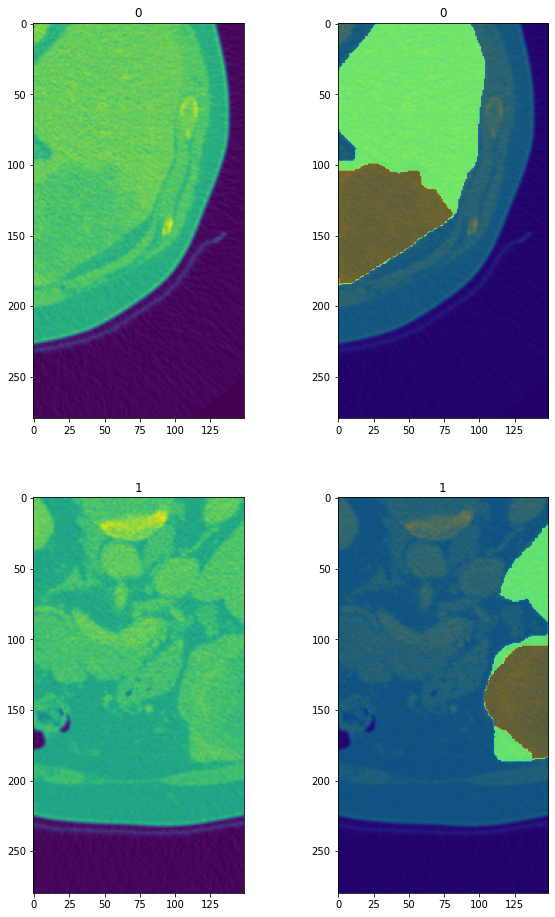

In [32]:
img_path = '/mnt/data/machine-learning/arina/mots/0Liver/imagesTr/liver_100.nii.gz'
lbl_path = '/mnt/data/machine-learning/arina/mots/0Liver/labelsTr/liver_100.nii.gz'
test_vol = OneVolume(img_path)
test_lbl = ExpandedPaddedSegmentation(lbl_path)
test_data = VolumeSlicingDataset(volume=test_vol, segmentation=test_lbl, augmentations=crop_in_mask)

n_plots = 2
log_step = len(test_lbl) // n_plots + 1
print(len(test_lbl), len(test_vol))

j = 0
f, axs = plt.subplots(n_plots, 2, figsize=(10, 8 * n_plots))
for i in range(n_plots):
    img, lbl = test_data[225]
    if lbl.sum() > 500 and j < n_plots:
        axs[j][0].imshow(img.squeeze())
        axs[j][0].set_title(str(i))
        axs[j][1].imshow(img.squeeze())
        axs[j][1].imshow(lbl.squeeze(), cmap='jet', alpha=0.5)
        axs[j][1].set_title(str(i))
        j += 1

In [20]:
from src.datasets import TVSD_rebalance

paths = [('/mnt/data/machine-learning/arina/mots_scaled/0Liver/labelsTr/liver_113.nii.gz',
         '/mnt/data/machine-learning/arina/mots/0Liver/labelsTr/liver_113.nii.gz'),
         ('/mnt/data/machine-learning/arina/mots_scaled/0Liver/imagesTr/liver_100.nii.gz',
         '/mnt/data/machine-learning/arina/mots_scaled/0Liver/labelsTr/liver_100.nii.gz'),
         ('/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00058/imaging.nii.gz',
         '/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00058/segmentation.nii.gz'),
         ('/mnt/data/machine-learning/arina/mots_scaled/2HepaticVessel/imagesTr/hepaticvessel_062.nii.gz',
         '/mnt/data/machine-learning/arina/mots_scaled/2HepaticVessel/labelsTr/hepaticvessel_062.nii.gz'),
         ('/mnt/data/machine-learning/arina/mots_scaled/3Pancreas/imagesTr/pancreas_107.nii.gz',
         '/mnt/data/machine-learning/arina/mots_scaled/3Pancreas/labelsTr/pancreas_107.nii.gz'),
         ('/mnt/data/machine-learning/arina/mots_scaled/4Colon/imagesTr/colon_081.nii.gz', 
         '/mnt/data/machine-learning/arina/mots/4Colon/labelsTr/colon_081.nii.gz'),
         ('/mnt/data/machine-learning/arina/mots_scaled/5Lung/imagesTr/lung_070.nii.gz', 
         '/mnt/data/machine-learning/arina/mots_scaled/5Lung/labelsTr/lung_070.nii.gz'),
         ('/mnt/data/machine-learning/arina/mots_scaled/6Spleen/imagesTr/spleen_8.nii.gz', 
         '/mnt/data/machine-learning/arina/mots_scaled/6Spleen/labelsTr/spleen_8.nii.gz'),
                 ]

#paths = gather_paths(path='/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt')
aug = strong_aug
test_data = get_TVSD_datasets(paths, aug=aug, n_procs=16, crop_size=[280, 149], 
                              localised_crop=True, mode_3d=False) #get_TVSD_datasets(paths, aug=strong_aug)
#test_data = TVSD_rebalance(test_data)

sums = defaultdict(set)
for i, (img, lbl) in enumerate(tqdm(islice(test_data, 0, 5000))):
    dataset_idx = bisect.bisect_right(test_data.cumulative_sizes, i)
    t=test_data.datasets[dataset_idx].task
    sums[t].update(set(lbl.reshape(-1).tolist()))
    if i > len(test_data):
        break
print(sums)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   3 out of   8 | elapsed:    4.5s remaining:    7.5s
[Parallel(n_jobs=16)]: Done   5 out of   8 | elapsed:    5.2s remaining:    3.1s
[Parallel(n_jobs=16)]: Done   8 out of   8 | elapsed:    7.7s finished


0it [00:00, ?it/s]

defaultdict(<class 'set'>, {0: {0, 1, 2}, 1: {0, 1, 2}, 2: {0, 1, 2}, 3: {0, 1, 2}, 4: {0.0, 1.0}, 5: {0, 1}, 6: {0, 1}})


319 319


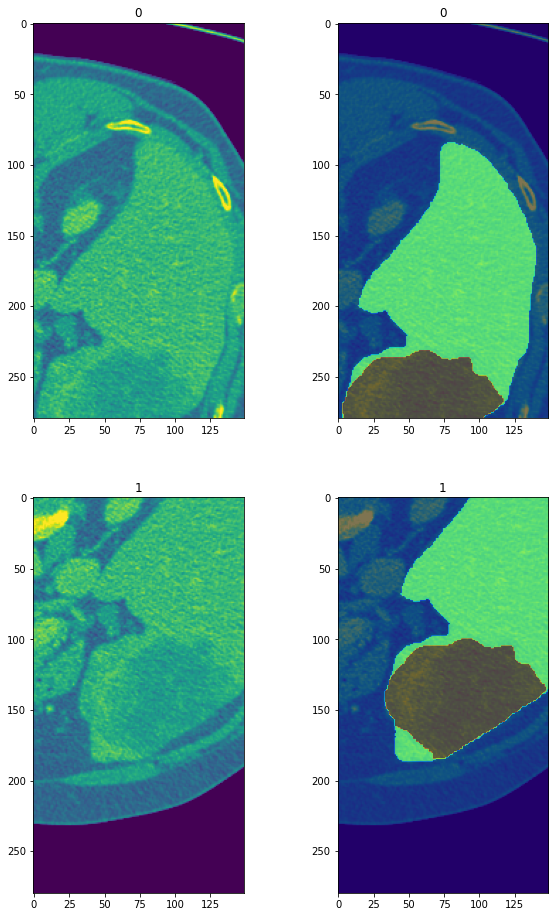

In [34]:
img_path = '/mnt/data/machine-learning/arina/mots_scaled/0Liver/imagesTr/liver_100.nii.gz'
lbl_path = '/mnt/data/machine-learning/arina/mots_scaled/0Liver/labelsTr/liver_100.nii.gz'
test_vol = OneVolume(img_path)
test_lbl = ExpandedPaddedSegmentation(lbl_path)
test_data = VolumeSlicingDataset(volume=test_vol, segmentation=test_lbl, augmentations=crop_in_mask)

n_plots = 2
log_step = len(test_lbl) // n_plots + 1
print(len(test_lbl), len(test_vol))

j = 0
f, axs = plt.subplots(n_plots, 2, figsize=(10, 8 * n_plots))
for i in range(n_plots):
    img, lbl = test_data[225]
    if lbl.sum() > 500 and j < n_plots:
        axs[j][0].imshow(img.squeeze())
        axs[j][0].set_title(str(i))
        axs[j][1].imshow(img.squeeze())
        axs[j][1].imshow(lbl.squeeze(), cmap='jet', alpha=0.5)
        axs[j][1].set_title(str(i))
        j += 1

320 320


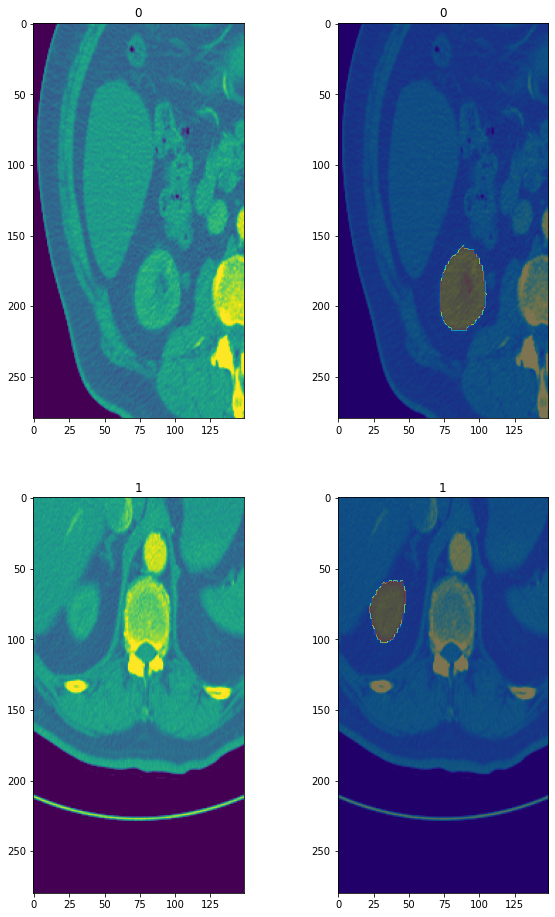

In [10]:
img_path = '/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00004/imaging.nii.gz'
lbl_path = '/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00004/segmentation.nii.gz'
test_vol = OneVolume(img_path)
test_lbl = ExpandedPaddedSegmentation(lbl_path)
test_data = VolumeSlicingDataset(volume=test_vol, segmentation=test_lbl, augmentations=crop_in_mask)

n_plots = 2
log_step = len(test_lbl) // n_plots + 1
print(len(test_lbl), len(test_vol))

j = 0
f, axs = plt.subplots(n_plots, 2, figsize=(10, 8 * n_plots))
for i in range(n_plots * 5):
    img, lbl = test_data[np.random.randint(0, len(test_data))]
    if lbl.sum() > 500 and j < n_plots:
        axs[j][0].imshow(img.squeeze())
        axs[j][0].set_title(str(i))
        axs[j][1].imshow(img.squeeze())
        axs[j][1].imshow(lbl.squeeze(), cmap='jet', alpha=0.5)
        axs[j][1].set_title(str(i))
        j += 1

In [22]:
from src.datasets import gather_paths, sklearn_train_test_split, get_TVSD_datasets, TVSDTaskWrapper
from src.augmentations import strong_aug

paths = gather_paths(path='/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt')
train_data, test_data = sklearn_train_test_split(paths, random_state=42)
aug = strong_aug
train_set = get_TVSD_datasets(train_data, aug=aug, n_procs=16, crop_size=[280, 149], 
                              localised_crop=True, mode_3d=False)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:   13.4s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:   46.3s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:  1.5min
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:  2.5min
[Parallel(n_jobs=16)]: Done 616 tasks      | elapsed:  3.7min
[Parallel(n_jobs=16)]: Done 688 out of 688 | elapsed:  4.1min finished


In [23]:
sums = defaultdict(set)
sums_w = defaultdict(set)
resampled = TVSD_dataset_resample(train_set)
for i, batch in enumerate(tqdm(islice(resampled, 0, 100))):
    img, labels = batch
    idx = resampled.indices[i]
    dataset_idx = bisect.bisect_right(resampled.dataset.cumulative_sizes, idx)
    t=resampled.dataset.datasets[dataset_idx].task
    sums[t].update(set(labels.reshape(-1).tolist()))
    sums_w[t].update(set(TVSDTaskWrapper.id2trainId(labels, t).reshape(-1).tolist()))
print(sums)
print(sums_w)

0it [00:00, ?it/s]

defaultdict(<class 'set'>, {6: {0, 1}, 2: {0, 1, 2}, 1: {0, 1, 2}, 3: {0, 1, 2}, 0: {0, 1, 2}, 4: {0, 1}})
defaultdict(<class 'set'>, {6: {0.0, 1.0}, 2: {0.0, 1.0}, 1: {0.0, 1.0}, 3: {0.0, 1.0}, 0: {0.0, 1.0}, 4: {0.0, 1.0}})


In [19]:
sums = defaultdict(int)
for batch in tqdm(TVSDTaskWrapper(TVSD_dataset_resample(train_set))):
    img, labels, tasks = batch
    if tasks.item() in [1, 4, 5]:
        sums[tasks.item()] += labels.sum()
print(sums)

  0%|          | 0/64978 [00:00<?, ?it/s]

defaultdict(<class 'int'>, {1: 0.0, 4: 0.0, 5: 596394.0})


246 246


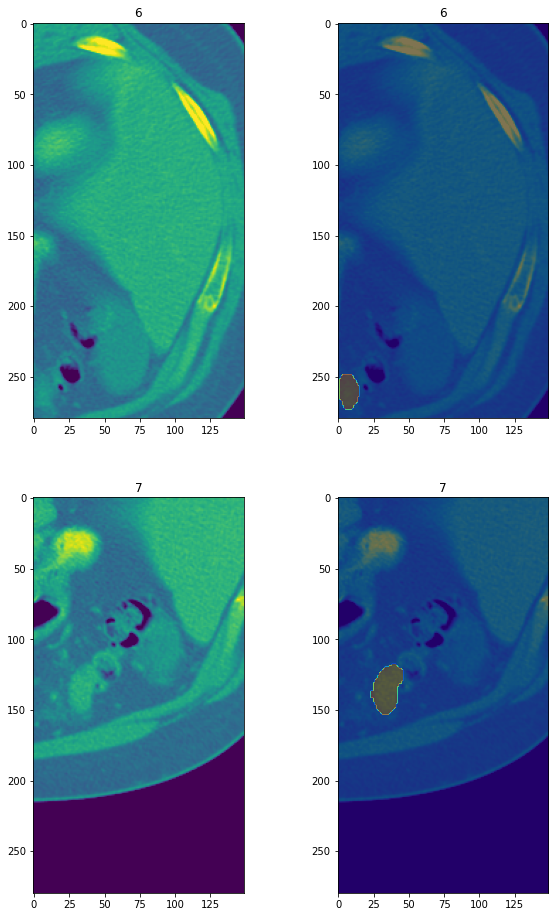

In [9]:
img_path = '/mnt/data/machine-learning/arina/mots_scaled/4Colon/imagesTr/colon_007.nii.gz'
lbl_path = '/mnt/data/machine-learning/arina/mots_scaled/4Colon/labelsTr/colon_007.nii.gz'

test_vol = OneVolume(img_path)
test_lbl = ExpandedPaddedSegmentation(lbl_path)
test_data = VolumeSlicingDataset(volume=test_vol, segmentation=test_lbl, augmentations=crop_in_mask)

n_plots = 2
log_step = len(test_lbl) // n_plots + 1
print(len(test_lbl), len(test_vol))

j = 0
f, axs = plt.subplots(n_plots, 2, figsize=(10, 8 * n_plots))
for i in range(n_plots * 5):
    img, lbl = test_data[np.random.randint(0, len(test_data))]
    if lbl.sum() > 500 and j < n_plots:
        axs[j][0].imshow(img.squeeze())
        axs[j][0].set_title(str(i))
        axs[j][1].imshow(img.squeeze())
        axs[j][1].imshow(lbl.squeeze(), cmap='jet', alpha=0.5)
        axs[j][1].set_title(str(i))
        j += 1

100%|██████████| 50/50 [41:32<00:00, 49.85s/it]


Text(0.5, 1.0, 'Rescale data loss (reconstruction RMSE)')

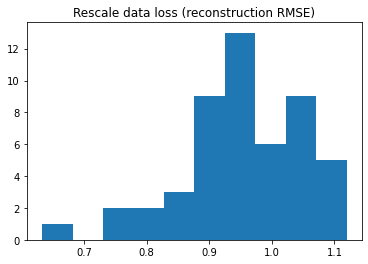

In [36]:
min_HU, max_HU = -325, 325 
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))
    
mean_loss = []
data_type = np.int32
mode_ = 'constant'
order = 3

for i, (img_path, data_path) in enumerate(tqdm(data_addresses[:50])):
    img_path = '/mnt/data/machine-learning/arina/mots_raw/' + img_path[len('/mnt/data/machine-learning/arina/mots/'):]
    imageITK = sitk.ReadImage(img_path)
    image = sitk.GetArrayFromImage(imageITK)
    ori_size = np.array(imageITK.GetSize())[[2, 1, 0]]
    ori_spacing = np.array(imageITK.GetSpacing())[[2, 1, 0]]
    ori_origin = imageITK.GetOrigin()
    ori_direction = imageITK.GetDirection()

    target_spacing = np.array([1.5, 0.8, 0.8])
    spc_ratio = ori_spacing / target_spacing
    image = image.astype(float)

    image_resize = resize(image, (int(ori_size[0] * spc_ratio[0]), int(ori_size[1] * spc_ratio[1]),
                                  int(ori_size[2] * spc_ratio[2])),
                          order=order, mode=mode_, cval=0, clip=True, preserve_range=True)
    image_resize = np.round(image_resize).astype(data_type)
    image_resize = np.transpose(image_resize, (2, 1, 0))
    image_init = np.clip(image_resize, min_HU, max_HU)
    image_rescale = rescale_intensity(image_init, out_range='uint8').astype('uint8')
    image_rescale_back = rescale_intensity(image_rescale, in_range='uint8', out_range=(min_HU, max_HU))
    mean_loss.append(np.sqrt(((image_rescale_back - image_init)**2).mean()))
plt.hist(mean_loss)
plt.title('Rescale data loss (reconstruction RMSE)')

## get_TVSD + crop_aug check 

In [37]:
%%time
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))
    
    
train_data = get_TVSD_datasets(data_addresses, aug=crop_in_mask, n_procs=16)
print(len(train_data))

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:  1.0min
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:  3.1min
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:  5.4min
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:  7.5min
[Parallel(n_jobs=16)]: Done 616 tasks      | elapsed:  9.9min
[Parallel(n_jobs=16)]: Done 795 out of 795 | elapsed: 13.7min finished


208837
CPU times: user 2min 56s, sys: 8min 53s, total: 11min 49s
Wall time: 13min 44s


  4%|▎         | 7500/208837 [00:16<07:26, 451.06it/s]


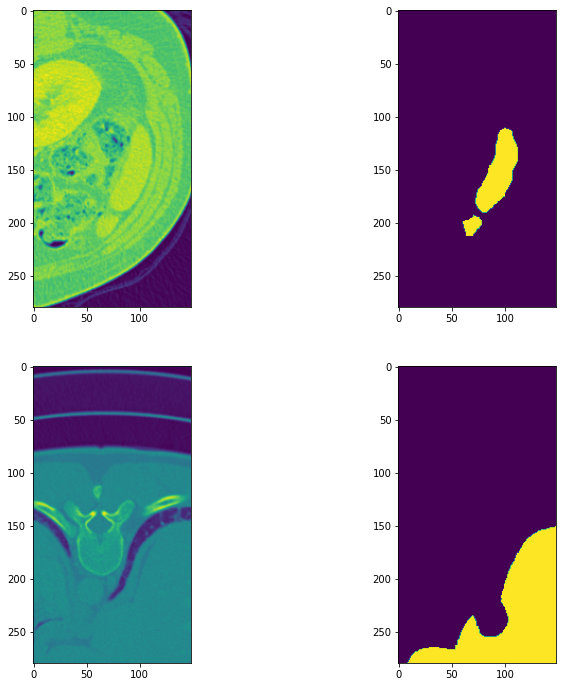

In [38]:
n_rows = 2
log_step = len(train_data) // n_rows + 1

f, axs = plt.subplots(n_rows, 2, figsize=(12, 6 * n_rows))

j = 0
for i, (img, label) in enumerate(tqdm(train_data)):
    if label.sum() > 500 and j < n_rows and i % 1250 == 0:
        dataset_id = bisect.bisect_right(train_data.cumulative_sizes, i)
        name = train_data.datasets[dataset_id].name.split('/')[-1]
        task = train_data.datasets[dataset_id].task
        axs[j][0].imshow(img.squeeze())
        #axs[j][0].set_title( + f'{task}, {name}, idx: {str(i - train_data.cumulative_sizes[dataset_id - 1])}')
        axs[j][1].imshow(label.squeeze())
        j += 1
    if j == n_rows:
        break

## Compare Albu and Batchgenerators

In [65]:
%%time
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))
    
train_no_aug = get_TVSD_datasets(data_addresses, n_procs=32)
print(len(train_no_aug))

[Parallel(n_jobs=32)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done   8 tasks      | elapsed:  1.1min
[Parallel(n_jobs=32)]: Done  98 tasks      | elapsed:  1.9min
[Parallel(n_jobs=32)]: Done 224 tasks      | elapsed:  3.0min
[Parallel(n_jobs=32)]: Done 386 tasks      | elapsed:  4.1min
[Parallel(n_jobs=32)]: Done 584 tasks      | elapsed:  5.2min
[Parallel(n_jobs=32)]: Done 774 out of 774 | elapsed:  6.5min finished


202427
CPU times: user 1min 17s, sys: 4min 45s, total: 6min 3s
Wall time: 6min 36s


101214


  0%|          | 0/202427 [00:00<?, ?it/s]

albu mse: 11262.435546875 batchgen mse: 11277.57177734375


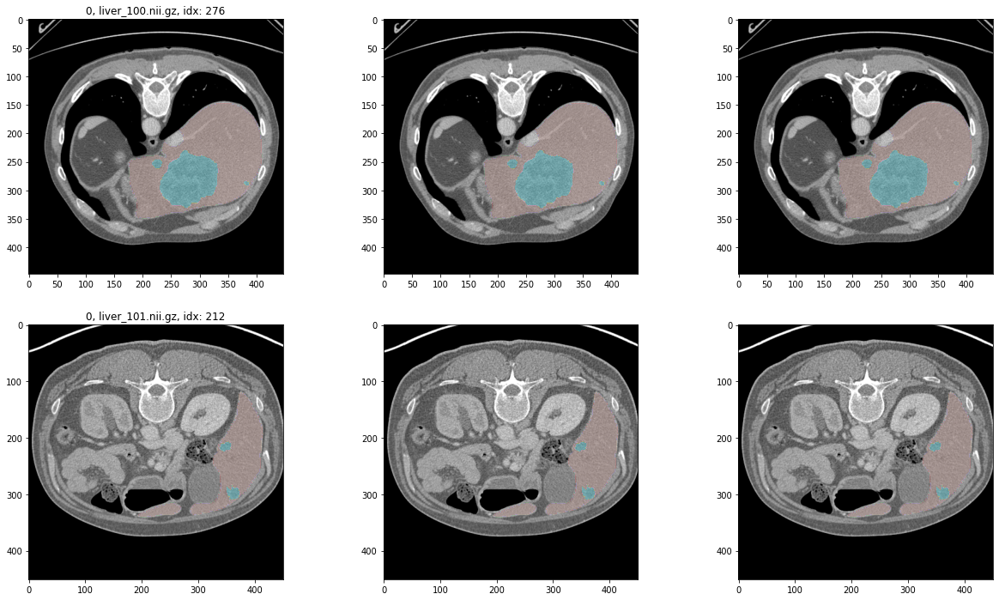

In [88]:
from src.augmentations import test, test_albu

n_rows = 2
log_step = len(train_no_aug) // n_rows + 1
print(log_step)

f, axs = plt.subplots(n_rows, 3, figsize=(21, 6 * n_rows))

j = 0
albu_mse, mse = 0, 0
for i, (img, label) in enumerate(tqdm(train_no_aug)):
    if label.sum() > 500 and j < n_rows and i % 255 == 0:
        data_albu = {'image': img, 'mask': label}
        data = {'image': img[None, :], 'mask': label[None, :]}
        albu = test_albu(**deepcopy(data_albu))
        batchgen = test(**deepcopy(data))
        
        dataset_id = bisect.bisect_right(train_no_aug.cumulative_sizes, i)
        name = train_no_aug.datasets[dataset_id].name
        name = train_no_aug.datasets[dataset_id].name.split('/')[-1]
        task = train_no_aug.datasets[dataset_id].task
        
        axs[j][0].set_title( f'{task}, {name}, idx: {str(i - train_no_aug.cumulative_sizes[dataset_id - 1])}')
        axs[j][0].imshow(img[0], cmap='gray')
        axs[j][0].imshow(label[0], cmap='tab10', alpha=(label[0] > 0) * 0.3)
        
        axs[j][1].imshow(albu['image'][0], cmap='gray')
        axs[j][1].imshow(albu['mask'][0], cmap='tab10', alpha=(albu['mask'][0] > 0) * 0.3)
        
        axs[j][2].imshow(batchgen['image'].squeeze(), cmap='gray')
        axs[j][2].imshow(batchgen['mask'].squeeze(), cmap='tab10', alpha=(batchgen['mask'].squeeze() > 0) * 0.3)
        j += 1
        
        albu_mse += ((img - albu['image'])**2).mean()
        mse += ((img - batchgen['image'][0])**2).mean()
        
    if j == n_rows:
        break

print('albu mse:', albu_mse / n_rows, 'batchgen mse:', mse / n_rows)

### Normalization params

In [76]:
%%time
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))

#no normalization in strong_aug_yet    
train = get_TVSD_datasets(data_addresses, aug=strong_aug_albu, n_procs=32)
print(len(train))

[Parallel(n_jobs=32)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done   8 tasks      | elapsed:    5.9s
[Parallel(n_jobs=32)]: Done  98 tasks      | elapsed:  1.1min
[Parallel(n_jobs=32)]: Done 224 tasks      | elapsed:  2.4min
[Parallel(n_jobs=32)]: Done 386 tasks      | elapsed:  3.7min
[Parallel(n_jobs=32)]: Done 584 tasks      | elapsed:  4.9min


202427
CPU times: user 1min 32s, sys: 4min 18s, total: 5min 51s
Wall time: 6min 22s


[Parallel(n_jobs=32)]: Done 774 out of 774 | elapsed:  6.4min finished


In [82]:
loader = DataLoader(train_resampled,
                    batch_size=256,
                    num_workers=0,
                    shuffle=False)

mean = 0.0
for images, _ in tqdm(loader):
    batch_samples = images.size(0) 
    images = images.view(batch_samples, images.size(1), -1)
    mean += images.mean(2).sum(0)
mean = mean / len(loader.dataset)

var = 0.0
for images, _ in tqdm(loader):
    batch_samples = images.size(0)
    images = images.view(batch_samples, images.size(1), -1)
    var += ((images - mean.unsqueeze(1))**2).sum([0,2])
std = torch.sqrt(var / (len(loader.dataset)* 280 * 149))
print(f'mean: {mean}, std: {std}')
gc.collect()

  0%|          | 0/318 [00:00<?, ?it/s]

  0%|          | 0/318 [00:00<?, ?it/s]

mean: tensor([0.3922]), std: tensor([0.2753])


## Wrapper dataset

In [247]:
%%time
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))

#no normalization in strong_aug_yet    
train = get_TVSD_datasets(data_addresses, aug=strong_aug, n_procs=32)
train_resampled = TVSD_dataset_resample(train)
aug_data = TVSDTaskWrapper(train_resampled)

[Parallel(n_jobs=32)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done   9 tasks      | elapsed:  3.4min
[Parallel(n_jobs=32)]: Done  99 tasks      | elapsed:  4.2min
[Parallel(n_jobs=32)]: Done 225 tasks      | elapsed:  5.2min
[Parallel(n_jobs=32)]: Done 387 tasks      | elapsed:  6.2min
[Parallel(n_jobs=32)]: Done 585 tasks      | elapsed:  7.2min
[Parallel(n_jobs=32)]: Done 819 tasks      | elapsed:  8.6min


CPU times: user 1min 21s, sys: 7min 4s, total: 8min 26s
Wall time: 9min 23s


[Parallel(n_jobs=32)]: Done 918 out of 918 | elapsed:  9.4min finished


  0%|          | 0/86385 [00:00<?, ?it/s]

87054

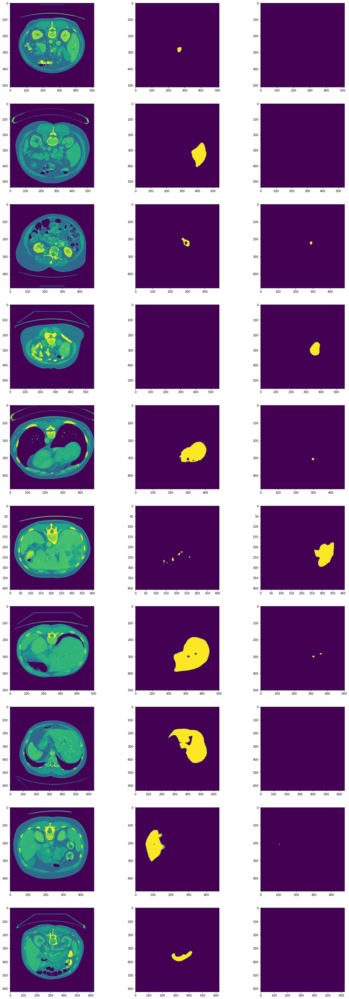

In [252]:
train_loader = DataLoader(aug_data, batch_size=1, shuffle=True)
log_step = 2000
n_plots = 10
f, axs = plt.subplots(n_plots, 3, figsize=(21, 6 * n_plots))
idx = 0
for i, (img, label, task) in enumerate(tqdm(train_loader)):
    if i % log_step == 0 and label.sum() > 500 and idx < n_plots:
        axs[idx][0].imshow(img.squeeze())
        axs[idx][1].imshow(label[:, 0].squeeze())
        axs[idx][2].imshow(label[:, 1].squeeze())
        
        idx += 1
    if idx == n_plots:
        break
gc.collect()

  0%|          | 0/86385 [00:00<?, ?it/s]

170788

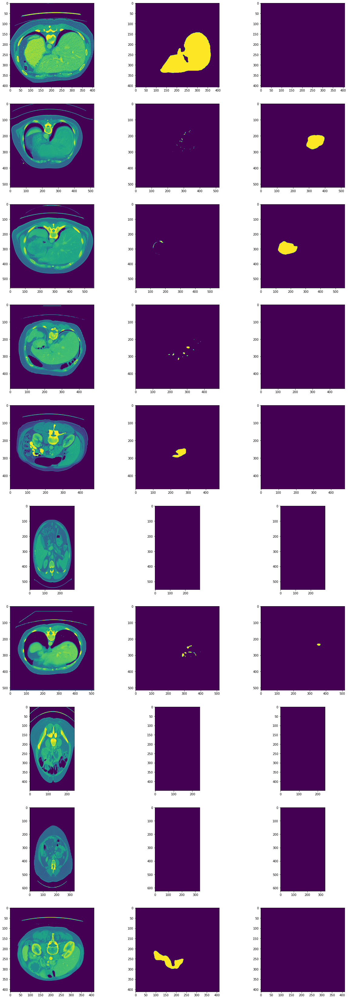

In [251]:
train_loader = DataLoader(aug_data, batch_size=1, shuffle=True)
log_step = 2000
n_plots = 20
f, axs = plt.subplots(n_plots, 3, figsize=(21, 6 * n_plots))
idx = 0
for i, (img, label, task) in enumerate(tqdm(train_loader)):
    if i % log_step == 0 and (label.sum() > 500 or task.item() in [1, ]) and idx < n_plots:
        axs[idx][0].imshow(img.squeeze())
        axs[idx][1].imshow(label[:, 0].squeeze())
        axs[idx][2].imshow(label[:, 1].squeeze())
        
        idx += 1
    if idx == n_plots:
        break
gc.collect()

[Parallel(n_jobs=32)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done   8 tasks      | elapsed:  1.0min
[Parallel(n_jobs=32)]: Done  98 tasks      | elapsed:  1.8min
[Parallel(n_jobs=32)]: Done 224 tasks      | elapsed:  2.7min
[Parallel(n_jobs=32)]: Done 386 tasks      | elapsed:  3.6min
[Parallel(n_jobs=32)]: Done 584 tasks      | elapsed:  4.4min
[Parallel(n_jobs=32)]: Done 818 tasks      | elapsed:  5.9min
[Parallel(n_jobs=32)]: Done 918 out of 918 | elapsed:  6.5min finished


  0%|          | 0/86385 [00:00<?, ?it/s]

55

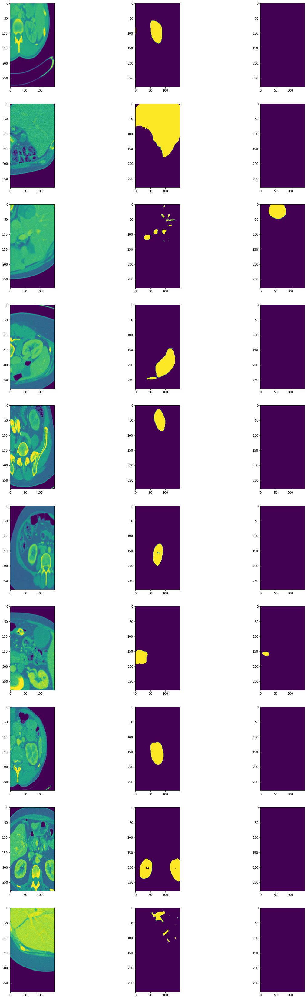

In [37]:
from src.augmentations import strong_aug


with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))

#no normalization in strong_aug_yet    
train = get_TVSD_datasets(data_addresses, aug=strong_aug, n_procs=32, crop_size=(280, 149), localised_crop=True)
train_resampled = TVSD_dataset_resample(train)
aug_data = TVSDTaskWrapper(train_resampled)

train_loader = DataLoader(aug_data, batch_size=1)
log_step = 2000
n_plots = 10
f, axs = plt.subplots(n_plots, 3, figsize=(21, 6 * n_plots))
idx = 0
for i, (img, label, task) in enumerate(tqdm(train_loader)):
    if i % log_step == 0 and label.sum() > 500 and idx < n_plots:
        axs[idx][0].imshow(img.squeeze())
        axs[idx][1].imshow(label[:, 0].squeeze())
        axs[idx][2].imshow(label[:, 1].squeeze())
        
        idx += 1
    if idx == n_plots:
        break
gc.collect()

### profiling

In [8]:
%%time

path_train_info = '/mnt/data/machine-learning/arina/MOTS_train.txt'
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))
    
train_no_aug = get_TVSD_datasets(data_addresses, n_procs=32)
print(len(train_no_aug))

[Parallel(n_jobs=32)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done   8 tasks      | elapsed:   42.7s
[Parallel(n_jobs=32)]: Done  98 tasks      | elapsed:  2.6min
[Parallel(n_jobs=32)]: Done 224 tasks      | elapsed:  4.9min
[Parallel(n_jobs=32)]: Done 386 tasks      | elapsed:  7.1min
[Parallel(n_jobs=32)]: Done 584 tasks      | elapsed:  9.3min


208837
CPU times: user 2min 47s, sys: 8min 21s, total: 11min 8s
Wall time: 13min 3s


[Parallel(n_jobs=32)]: Done 795 out of 795 | elapsed: 13.1min finished


In [9]:
%%time

path_train_info = '/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt'
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))
    
train_no_aug = get_TVSD_datasets(data_addresses, n_procs=32)
print(len(train_no_aug))

[Parallel(n_jobs=32)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done   9 tasks      | elapsed:  2.0min
[Parallel(n_jobs=32)]: Done  99 tasks      | elapsed:  2.8min
[Parallel(n_jobs=32)]: Done 225 tasks      | elapsed:  3.8min
[Parallel(n_jobs=32)]: Done 387 tasks      | elapsed:  5.0min
[Parallel(n_jobs=32)]: Done 585 tasks      | elapsed:  6.2min
[Parallel(n_jobs=32)]: Done 774 out of 774 | elapsed:  7.5min finished


202427
CPU times: user 1min 19s, sys: 5min 43s, total: 7min 3s
Wall time: 7min 40s


In [41]:
%lprun -f get_TVSD_datasets get_TVSD_datasets(data_addresses[:100], aug=crop_in_mask)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  3.6min finished


### Tasks checkup

In [7]:
data_addresses = [('/mnt/data/machine-learning/arina/mots_scaled/0Liver/imagesTr/liver_100.nii.gz',
                   '/mnt/data/machine-learning/arina/mots_scaled/0Liver/labelsTr/liver_100.nii.gz'),
                  ('/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00058/imaging.nii.gz',
                   '/mnt/data/machine-learning/arina/mots_scaled/1Kidney/origin/case_00058/segmentation.nii.gz'),
                  ('/mnt/data/machine-learning/arina/mots_scaled/2HepaticVessel/imagesTr/hepaticvessel_062.nii.gz',
                   '/mnt/data/machine-learning/arina/mots_scaled/2HepaticVessel/labelsTr/hepaticvessel_062.nii.gz'),
                  ('/mnt/data/machine-learning/arina/mots_scaled/3Pancreas/imagesTr/pancreas_107.nii.gz',
                   '/mnt/data/machine-learning/arina/mots_scaled/3Pancreas/labelsTr/pancreas_107.nii.gz'),
                  ('/mnt/data/machine-learning/arina/mots_scaled/4Colon/imagesTr/colon_081.nii.gz', 
                   '/mnt/data/machine-learning/arina/mots_scaled/4Colon/labelsTr/colon_081.nii.gz'),
                  ('/mnt/data/machine-learning/arina/mots_scaled/5Lung/imagesTr/lung_070.nii.gz', 
                   '/mnt/data/machine-learning/arina/mots_scaled/5Lung/labelsTr/lung_070.nii.gz'),
                  ('/mnt/data/machine-learning/arina/mots_scaled/6Spleen/imagesTr/spleen_8.nii.gz', 
                   '/mnt/data/machine-learning/arina/mots_scaled/6Spleen/labelsTr/spleen_8.nii.gz'),
                 ]

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of   7 | elapsed:   38.2s remaining:  1.6min
[Parallel(n_jobs=16)]: Done   4 out of   7 | elapsed:   38.7s remaining:   29.0s
[Parallel(n_jobs=16)]: Done   7 out of   7 | elapsed:   40.4s finished


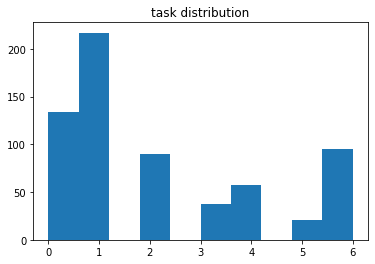

In [33]:
train = get_TVSD_datasets(data_addresses, aug=strong_aug_albu, n_procs=16)
train_resampled = TVSD_dataset_resample(train)
aug_data = TVSDTaskWrapper(train_resampled)
plt.hist(aug_data.tasks)
plt.title('task distribution');

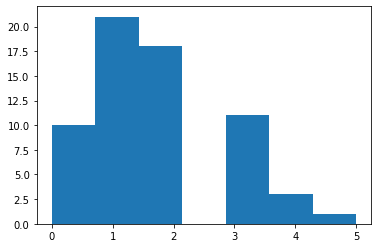

In [32]:
batch_size = 64
train_loader = DataLoader(aug_data, batch_size=batch_size)
img, lbl, tasks = next(iter(train_loader))

plt.hist(tasks.numpy(), bins=7);

# Model + peak bs

In [10]:
from src.models import count_parameters, get_recommended_batch_size, SegmentationModel
from src.losses import ContrastiveLoss

In [19]:
%%time
with open(path_train_info, 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))
    
train = get_TVSD_datasets(data_addresses, aug=strong_aug_albu, n_procs=32)
train_resampled = TVSD_dataset_resample(train)
aug_data = TVSDTaskWrapper(train_resampled)
print(f'len of initial dataset: {len(train)}, len of resampled dataset: {len(train_resampled)}')

[Parallel(n_jobs=32)]: Using backend LokyBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done   8 tasks      | elapsed:  1.0min
[Parallel(n_jobs=32)]: Done  98 tasks      | elapsed:  1.8min
[Parallel(n_jobs=32)]: Done 224 tasks      | elapsed:  2.7min
[Parallel(n_jobs=32)]: Done 386 tasks      | elapsed:  3.6min
[Parallel(n_jobs=32)]: Done 584 tasks      | elapsed:  4.4min
[Parallel(n_jobs=32)]: Done 818 tasks      | elapsed:  5.8min


len of initial dataset: 240190, len of resampled dataset: 86385
CPU times: user 1min 17s, sys: 4min 39s, total: 5min 57s
Wall time: 6min 31s


[Parallel(n_jobs=32)]: Done 918 out of 918 | elapsed:  6.5min finished


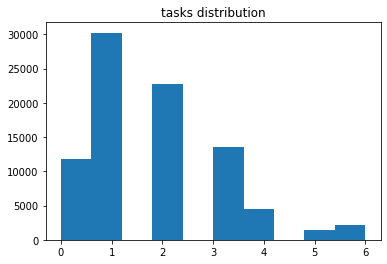

In [13]:
plt.hist(aug_data.tasks)
plt.title('tasks distribution');

In [20]:
batch_size = 64

with open(path_train_info, 'r') as f:
    data_addresses = map(lambda x: x.strip('\n').split('     '), f.readlines())
    
train_data = compose_dataset(data_addresses, strong_aug_albu, n_procs=16, upsample=2)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True)

backbone = deeplabv3_resnet50()
model = SegmentationModel(backbone, out_dim=32)
model.to(device)
params = count_parameters(model)
print(f'Number of parameters in the model: {params}')

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:  1.4min
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:  2.0min
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:  3.1min
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:  4.1min
[Parallel(n_jobs=16)]: Done 616 tasks      | elapsed:  5.4min
[Parallel(n_jobs=16)]: Done 850 tasks      | elapsed:  7.4min
[Parallel(n_jobs=16)]: Done 918 out of 918 | elapsed:  7.9min finished


Number of parameters in the model: 39639603


In [9]:
gc.collect()

1948

In [19]:
criterion = ContrastiveLoss(device, batch_size // 2, 20)
for i, (img, labels, tasks) in enumerate(tqdm(train_loader)):
    features = model(img.to(device))
    labels = labels.to(device)
    loss = criterion(features, labels, tasks).item()

  0%|          | 0/2699 [00:00<?, ?it/s]

In [ ]:
criterion = ContrastiveLoss(device, batch_size // 2, 20)
for i, (img, labels, tasks) in enumerate(tqdm(train_loader)):
    features = model(img.to(device))
    labels = labels.to(device)
    loss = criterion(features, labels, tasks).item()

  0%|          | 0/2699 [00:00<?, ?it/s]

### Masking checkup

178228

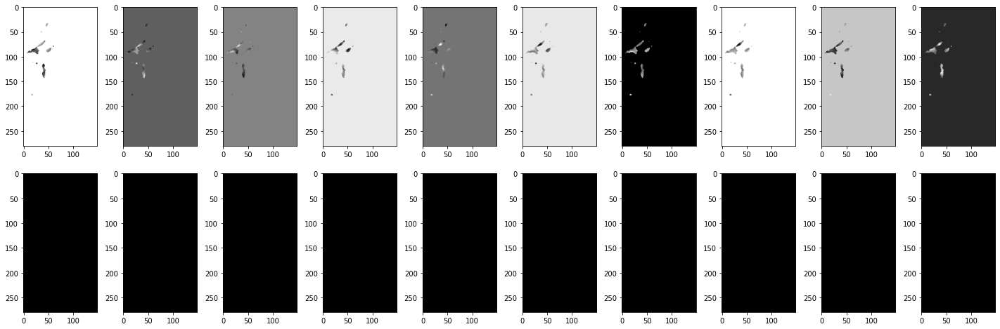

In [221]:
f, axs = plt.subplots(2, 10, figsize=(25, 8))
idx = 0
for i, ch in enumerate(res[0]):
    for j, pic in enumerate(ch[:10]):
        axs[i][j].imshow(pic.detach().cpu().squeeze(), cmap='gray')

gc.collect()

  0%|          | 0/5 [00:00<?, ?it/s]

margin: 1078
margin: 1042
margin: 503
margin: 1178
margin: 1243


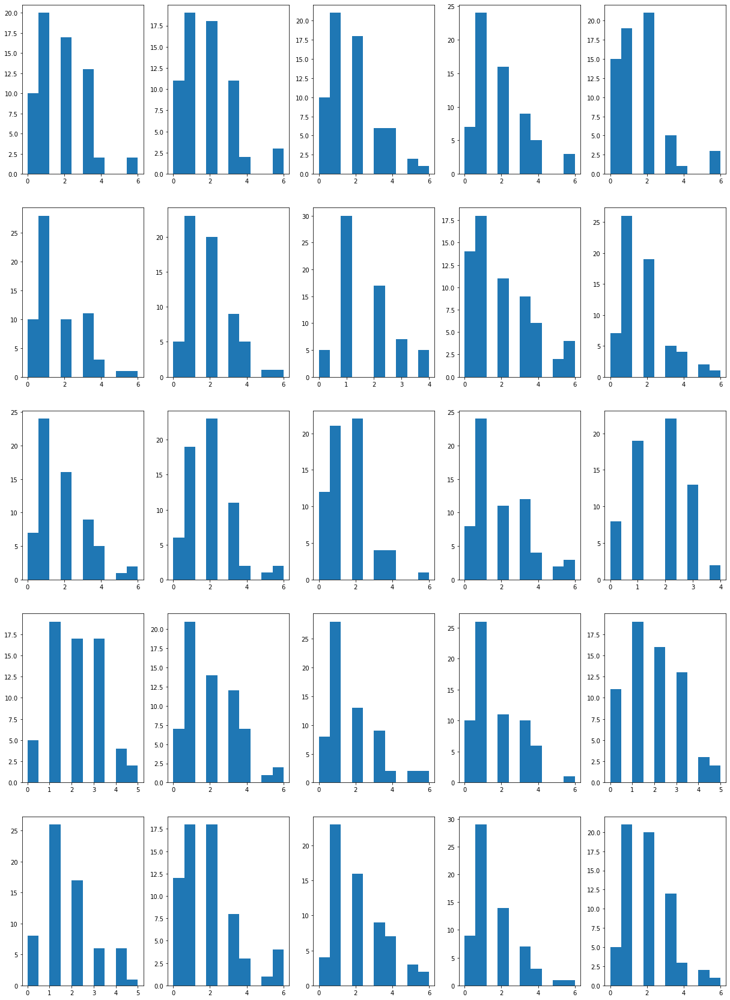

In [12]:
batch_size = 64
n_batches = 5
train_loader = DataLoader(aug_data, batch_size=batch_size, shuffle=True)
n_exps = 5
f, axs = plt.subplots(n_exps, n_batches, figsize=(21, 6 * n_exps))
for i in tqdm(range(n_exps)):
    tasks = []
    margin = np.random.randint(0, len(train_loader) - n_batches)
    print('margin:', margin)
    for (img, lbl, task) in islice(train_loader, margin, margin + n_batches):
        img = img.to(device)
        lbl = lbl.to(device)
        out = model(img)
        tasks.append(task)

    for j in range(n_batches):
        axs[i][j].hist(tasks[j].numpy())

## Balanced resampling

(array([24548., 24523.,     0., 24966.,     0., 24839., 24566.,     0.,
        24692., 24636.]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 <BarContainer object of 10 artists>)

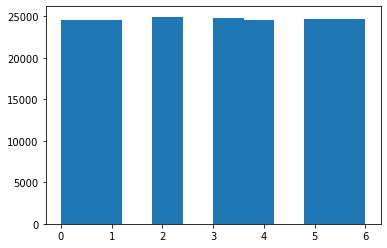

In [203]:
balanced_dataset = TaskWrapper_balanced_resample(aug_data, upsample=2)
plt.hist(balanced_dataset.dataset.tasks[balanced_dataset.indices])

In [62]:
print(len(balanced_dataset))

1302


  0%|          | 0/5 [00:00<?, ?it/s]

margin: 8
margin: 4
margin: 4
margin: 15
margin: 7


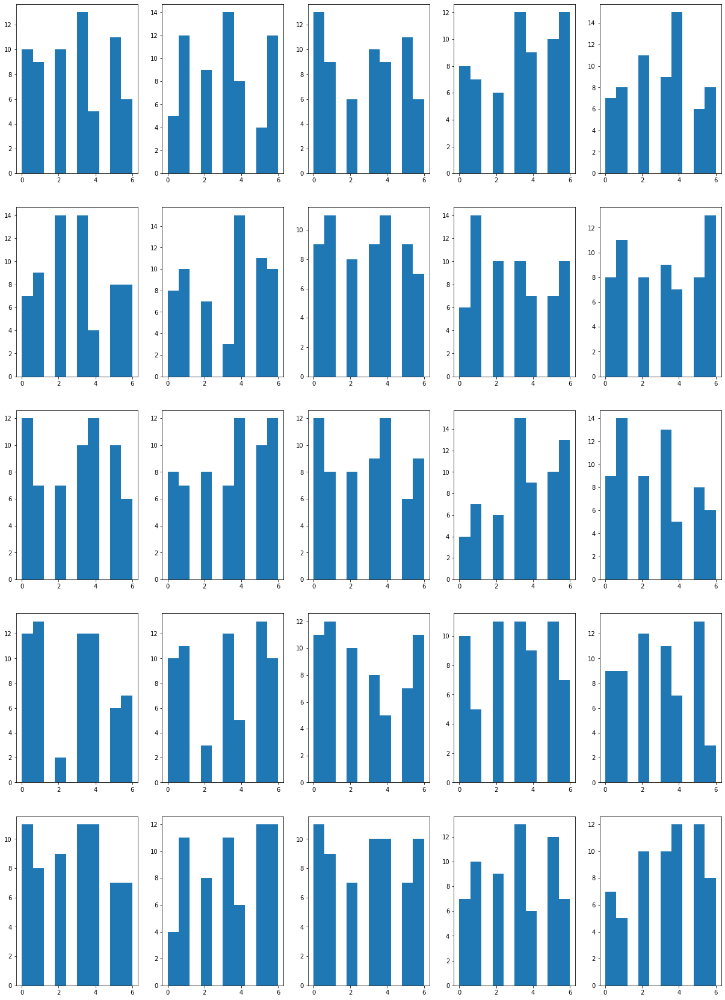

In [63]:
batch_size = 64
n_batches = 5
train_loader = DataLoader(balanced_dataset, batch_size=batch_size, shuffle=True)
n_exps = 5
f, axs = plt.subplots(n_exps, n_batches, figsize=(21, 6 * n_exps))
for i in tqdm(range(n_exps)):
    tasks = []
    margin = np.random.randint(0, len(train_loader) - n_batches)
    print('margin:', margin)
    for (img, lbl, task) in islice(train_loader, margin, margin + n_batches):
        img = img.to(device)
        lbl = lbl.to(device)
        out = model(img)
        tasks.append(task)

    for j in range(n_batches):
        axs[i][j].hist(tasks[j].numpy())

# Catalyst

In [25]:
from catalyst.contrib.callbacks.wandb_logger import WandbLogger
from catalyst.callbacks.checkpoint import CheckpointCallback
from catalyst.callbacks.early_stop import EarlyStoppingCallback
from catalyst import dl
from catalyst.data import ToTensor

In [11]:
data_params = {'train_path':'/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt',
               'test_path': '/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_test.txt',
               'batch_size': 128, 'n_tasks': 10, 'train_size': 0.8, 'n_procs': 16, 'upsample_for_balance': 2
              }

datasets = OrderedDict()

with open(data_params['train_path'], 'r') as f:
    data_addresses = list(map(lambda x: x.strip('\n').split('     '), f.readlines()))

train, val = train_test_split(data_addresses, train_size=data_params['train_size'])

datasets['train'] = compose_dataset(train, strong_aug, n_procs=data_params['n_procs'],
                             upsample=data_params['upsample_for_balance'])

datasets['valid'] = compose_dataset(val, strong_aug, n_procs=data_params['n_procs'],
                             upsample=data_params['upsample_for_balance'])


loaders = {
    "train": DataLoader(datasets['train'], batch_size=data_params['batch_size'], shuffle=True, drop_last=True),
    "valid": DataLoader(datasets['valid'], batch_size=data_params['batch_size'], shuffle=True, drop_last=True),
}

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:   18.9s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:   52.8s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:  1.7min
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:  2.6min
[Parallel(n_jobs=16)]: Done 616 tasks      | elapsed:  3.9min
[Parallel(n_jobs=16)]: Done 734 out of 734 | elapsed:  4.5min finished
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:   14.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:   48.0s
[Parallel(n_jobs=16)]: Done 184 out of 184 | elapsed:  1.1min finished


In [24]:
backbone = deeplabv3_resnet50()
model = SegmentationModel(backbone, out_dim=32)
criterion = ContrastiveLoss(device, data_params['batch_size'] // 2, data_params['n_tasks'])
optimizer = torch.optim.SGD(model.parameters(), lr=4e-4, momentum=0.9, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)
n_epochs = 5

In [27]:
class CustomRunner(dl.Runner):

    def predict_batch(self, batch):
        # model inference step
        return self.model(batch[0].to(self.device).view(batch[0].size(0), -1))

    def _handle_batch(self, batch):
        img, labels, tasks = batch
        features = self.model(img)
        loss = criterion(features, labels, tasks)
        self.batch_metrics.update(
            {"loss": loss}
        )


runner = CustomRunner()


# model training
runner.train(
    model=model,
    optimizer=optimizer,
    scheduler = scheduler,
    loaders=loaders,
    logdir="./logs",
    num_epochs=n_epochs,
    verbose=True,
    timeit=True,
    callbacks=[
        WandbLogger(project="Unsupervised segmentation", name='longer-try', log_on_batch_end=True),
        CheckpointCallback(2),
        EarlyStoppingCallback(10),
        dl.OptimizerCallback(metric_key="loss"), 
        dl.SchedulerCallback(reduced_metric="loss"),
    ]
)


loss/train_batch,-2.48379
timer/data_time/train_batch,5.44235
timer/model_time/train_batch,0.7341
timer/batch_time/train_batch,6.17645
timer/_fps/train_batch,20.72386
_runtime,3773
_timestamp,1624044247
_step,78080


loss/train_batch,█▇▆▆▅▆▅▇▃▃▄▄▅▆▃▂▃▅▂▃▃▅▃▄▅▅▃▃▄▂▂▄▄▄▂▃▃▂▁▂
timer/data_time/train_batch,▅▄▇▃▁▂▇▄▄▆▆▄▇█▅▅▂▄▅▁▇▄▇▄▅▂▃▃▅▃▆▅▆▄▇▄▂▄▅▇
timer/model_time/train_batch,▁▅█▃▇▅▃▇▅▅▄▅▃█▇▇▅▇▆▆▃▂▃▄▃▃▄▅▄▅▄█▆▅▇▄▆▇▄▇
timer/batch_time/train_batch,▄▄▇▃▁▂▆▄▄▆▆▃▇█▅▅▂▄▅▁▇▄▇▃▅▂▃▃▅▃▆▅▆▄▇▄▂▄▅▇
timer/_fps/train_batch,▅▅▂▆▇▇▃▅▅▃▃▅▂▁▄▄▇▅▄█▂▅▂▆▄▇▆▆▄▆▃▄▃▅▂▅▇▅▄▂
_runtime,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_timestamp,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


wandb: wandb version 0.10.32 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


1/5 * Epoch (train): 100% 1071/1071 [1:49:53<00:00,  6.10s/it, _timer/_fps=20.979, loss=-3.604e+00]

wandb: WARNING Step must only increase in log calls.  Step 1 < 137089; dropping {'loss/train_epoch': -2.3613786101945635, 'timer/data_time/train_epoch': 5.420514641467031, 'timer/model_time/train_epoch': 0.7327509342678012, 'timer/batch_time/train_epoch': 6.153271590739515, 'timer/_fps/train_epoch': 20.816317116156966}.


1/5 * Epoch (train): 100% 1071/1071 [1:49:53<00:00,  6.16s/it, _timer/_fps=20.979, loss=-3.604e+00]
1/5 * Epoch (valid): 100% 278/278 [09:56<00:00,  2.07s/it, _timer/_fps=62.379, loss=-2.754e+00]

wandb: WARNING Step must only increase in log calls.  Step 1 < 172673; dropping {'loss/valid_epoch': -3.3529804262915537, 'timer/data_time/valid_epoch': 1.455174953817464, 'timer/model_time/valid_epoch': 0.6889936306493742, 'timer/batch_time/valid_epoch': 2.1441828381243377, 'timer/_fps/valid_epoch': 59.93223305268558}.


1/5 * Epoch (valid): 100% 278/278 [09:56<00:00,  2.14s/it, _timer/_fps=62.379, loss=-2.754e+00]

/home/ws/yy1833/anaconda3/envs/seg/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:508: UserWarning:

To get the last learning rate computed by the scheduler, please use `get_last_lr()`.

wandb: WARNING Step must only increase in log calls.  Step 1 < 172673; dropping {'lr/_base_epoch': 0.0003999506545146187, 'momentum/_base_epoch': 0.9}.



[2021-06-18 23:28:24,724] 
1/5 * Epoch 1 (_base): lr=0.0004 | momentum=0.9000
1/5 * Epoch 1 (train): _timer/_fps=20.8163 | _timer/batch_time=6.1533 | _timer/data_time=5.4205 | _timer/model_time=0.7328 | loss=-2.361e+00
1/5 * Epoch 1 (valid): _timer/_fps=59.9322 | _timer/batch_time=2.1442 | _timer/data_time=1.4552 | _timer/model_time=0.6890 | loss=-3.353e+00
2/5 * Epoch (train): 100% 1071/1071 [1:49:41<00:00,  6.18s/it, _timer/_fps=20.634, loss=-5.043e+00]

wandb: WARNING Step must only increase in log calls.  Step 2 < 309761; dropping {'loss/train_epoch': -5.2569073226540315, 'timer/data_time/train_epoch': 5.408554601847409, 'timer/model_time/train_epoch': 0.7333055424089199, 'timer/batch_time/train_epoch': 6.141866217363005, 'timer/_fps/train_epoch': 20.853324210172293}.


2/5 * Epoch (train): 100% 1071/1071 [1:49:41<00:00,  6.15s/it, _timer/_fps=20.634, loss=-5.043e+00]
2/5 * Epoch (valid): 100% 278/278 [10:00<00:00,  2.15s/it, _timer/_fps=58.061, loss=-2.996e+00]

wandb: WARNING Step must only increase in log calls.  Step 2 < 345345; dropping {'loss/valid_epoch': -3.742930066657903, 'timer/data_time/valid_epoch': 1.468635839524029, 'timer/model_time/valid_epoch': 0.6896329697945135, 'timer/batch_time/valid_epoch': 2.158274719183393, 'timer/_fps/valid_epoch': 59.55911419371405}.


2/5 * Epoch (valid): 100% 278/278 [10:00<00:00,  2.16s/it, _timer/_fps=58.061, loss=-2.996e+00]

wandb: WARNING Step must only increase in log calls.  Step 2 < 345345; dropping {'lr/_base_epoch': 0.00039982731134614245, 'momentum/_base_epoch': 0.9}.



[2021-06-19 01:28:07,483] 
2/5 * Epoch 2 (_base): lr=0.0004 | momentum=0.9000
2/5 * Epoch 2 (train): _timer/_fps=20.8533 | _timer/batch_time=6.1419 | _timer/data_time=5.4086 | _timer/model_time=0.7333 | loss=-5.257e+00
2/5 * Epoch 2 (valid): _timer/_fps=59.5591 | _timer/batch_time=2.1583 | _timer/data_time=1.4686 | _timer/model_time=0.6896 | loss=-3.743e+00
3/5 * Epoch (train): 100% 1071/1071 [1:49:45<00:00,  6.18s/it, _timer/_fps=20.474, loss=-7.022e+00]

wandb: WARNING Step must only increase in log calls.  Step 3 < 482433; dropping {'loss/train_epoch': -6.102053086049895, 'timer/data_time/train_epoch': 5.41227876817257, 'timer/model_time/train_epoch': 0.7334194466068187, 'timer/batch_time/train_epoch': 6.145704274306668, 'timer/_fps/train_epoch': 20.839756285399}.


3/5 * Epoch (train): 100% 1071/1071 [1:49:45<00:00,  6.15s/it, _timer/_fps=20.474, loss=-7.022e+00]
3/5 * Epoch (valid): 100% 278/278 [09:58<00:00,  2.27s/it, _timer/_fps=54.433, loss=-8.485e+00]

wandb: WARNING Step must only increase in log calls.  Step 3 < 518017; dropping {'loss/valid_epoch': -4.693354494628506, 'timer/data_time/valid_epoch': 1.461656358602236, 'timer/model_time/valid_epoch': 0.6903859505550469, 'timer/batch_time/valid_epoch': 2.1520481478396065, 'timer/_fps/valid_epoch': 59.71954674823585}.


3/5 * Epoch (valid): 100% 278/278 [09:58<00:00,  2.15s/it, _timer/_fps=54.433, loss=-8.485e+00]

wandb: WARNING Step must only increase in log calls.  Step 3 < 518017; dropping {'lr/_base_epoch': 0.00039965467595111555, 'momentum/_base_epoch': 0.9}.



[2021-06-19 03:27:53,831] 
3/5 * Epoch 3 (_base): lr=0.0004 | momentum=0.9000
3/5 * Epoch 3 (train): _timer/_fps=20.8398 | _timer/batch_time=6.1457 | _timer/data_time=5.4123 | _timer/model_time=0.7334 | loss=-6.102e+00
3/5 * Epoch 3 (valid): _timer/_fps=59.7195 | _timer/batch_time=2.1520 | _timer/data_time=1.4617 | _timer/model_time=0.6904 | loss=-4.693e+00
4/5 * Epoch (train): 100% 1071/1071 [1:49:41<00:00,  6.23s/it, _timer/_fps=20.784, loss=-5.325e+00]

wandb: WARNING Step must only increase in log calls.  Step 4 < 655105; dropping {'loss/train_epoch': -6.655289592170941, 'timer/data_time/train_epoch': 5.408783237918537, 'timer/model_time/train_epoch': 0.7330074005322857, 'timer/batch_time/train_epoch': 6.141796712225339, 'timer/_fps/train_epoch': 20.854056122041413}.


4/5 * Epoch (train): 100% 1071/1071 [1:49:41<00:00,  6.14s/it, _timer/_fps=20.784, loss=-5.325e+00]
4/5 * Epoch (valid): 100% 278/278 [10:01<00:00,  2.08s/it, _timer/_fps=64.201, loss=-5.295e+00]

wandb: WARNING Step must only increase in log calls.  Step 4 < 690689; dropping {'loss/valid_epoch': -4.597448863919902, 'timer/data_time/valid_epoch': 1.4716436699997608, 'timer/model_time/valid_epoch': 0.6904316660311581, 'timer/batch_time/valid_epoch': 2.1620817990611805, 'timer/_fps/valid_epoch': 59.44027095445769}.


4/5 * Epoch (valid): 100% 278/278 [10:01<00:00,  2.16s/it, _timer/_fps=64.201, loss=-5.295e+00]

wandb: WARNING Step must only increase in log calls.  Step 4 < 690689; dropping {'lr/_base_epoch': 0.00039943279092248486, 'momentum/_base_epoch': 0.9}.



[2021-06-19 05:27:37,888] 
4/5 * Epoch 4 (_base): lr=0.0004 | momentum=0.9000
4/5 * Epoch 4 (train): _timer/_fps=20.8541 | _timer/batch_time=6.1418 | _timer/data_time=5.4088 | _timer/model_time=0.7330 | loss=-6.655e+00
4/5 * Epoch 4 (valid): _timer/_fps=59.4403 | _timer/batch_time=2.1621 | _timer/data_time=1.4716 | _timer/model_time=0.6904 | loss=-4.597e+00
5/5 * Epoch (train): 100% 1071/1071 [1:49:42<00:00,  6.13s/it, _timer/_fps=20.614, loss=-7.561e+00]

wandb: WARNING Step must only increase in log calls.  Step 5 < 827777; dropping {'loss/train_epoch': -6.851089445496697, 'timer/data_time/train_epoch': 5.409698095196991, 'timer/model_time/train_epoch': 0.7333924006792448, 'timer/batch_time/train_epoch': 6.1430966865226155, 'timer/_fps/train_epoch': 20.849063205693064}.


5/5 * Epoch (train): 100% 1071/1071 [1:49:42<00:00,  6.15s/it, _timer/_fps=20.614, loss=-7.561e+00]
5/5 * Epoch (valid): 100% 278/278 [09:58<00:00,  2.00s/it, _timer/_fps=65.644, loss=-6.914e+00]

wandb: WARNING Step must only increase in log calls.  Step 5 < 863361; dropping {'loss/valid_epoch': -5.229951289006704, 'timer/data_time/valid_epoch': 1.4624195107453168, 'timer/model_time/valid_epoch': 0.6898972499284811, 'timer/batch_time/valid_epoch': 2.1523226868334424, 'timer/_fps/valid_epoch': 59.70630202656693}.


5/5 * Epoch (valid): 100% 278/278 [09:58<00:00,  2.15s/it, _timer/_fps=65.644, loss=-6.914e+00]

wandb: WARNING Step must only increase in log calls.  Step 5 < 863361; dropping {'lr/_base_epoch': 0.00039916171100480666, 'momentum/_base_epoch': 0.9}.



[2021-06-19 07:27:20,754] 
5/5 * Epoch 5 (_base): lr=0.0004 | momentum=0.9000
5/5 * Epoch 5 (train): _timer/_fps=20.8491 | _timer/batch_time=6.1431 | _timer/data_time=5.4097 | _timer/model_time=0.7334 | loss=-6.851e+00
5/5 * Epoch 5 (valid): _timer/_fps=59.7063 | _timer/batch_time=2.1523 | _timer/data_time=1.4624 | _timer/model_time=0.6899 | loss=-5.230e+00


loss/train_batch,-7.56078
timer/data_time/train_batch,5.47752
timer/model_time/train_batch,0.73172
timer/batch_time/train_batch,6.20925
timer/_fps/train_batch,20.61441
_runtime,35934
_timestamp,1624080440
_step,863360
loss/valid_batch,-6.91441
timer/data_time/valid_batch,1.26255
timer/model_time/valid_batch,0.68735


loss/train_batch,██▄▆▄▄▅▅▆▃▃▂▅▄▄▄▅▃▅▃▇▄▅▇▄▄▂▄▄▆▄▂▂▆▁▂▂▅▃▂
timer/data_time/train_batch,▁▅▄▆▅█▅▄▅▅▇█▄▅▂▄▅▃▆▄▅▅▇▄▃▆▃▇▇▄▅▃▄▅▆▅▅▄▇▇
timer/model_time/train_batch,▁▅▃█▅▅▆▅▆▄▅▃▃▂▄▆▄▄▄▅▆▆▅▆▅▄▄▅▄▄▃▇▄▄▃▅▆▃▆▃
timer/batch_time/train_batch,▁▅▄▆▅█▅▄▅▆▇▇▄▅▂▄▅▃▆▄▅▅▇▄▃▆▃▇▇▄▅▃▄▅▆▅▅▄▇▇
timer/_fps/train_batch,█▄▄▃▄▁▄▅▄▃▂▁▅▄▇▅▄▆▃▅▄▄▂▅▅▃▆▂▂▅▃▆▅▄▃▄▃▅▂▂
_runtime,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
_timestamp,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
loss/valid_batch,▄▃█▅▄▄▇▂▄▄▅▅▄▅▅▇▃▄▂▅▇▄▄▆▁▇▄▂▃▃▁▃▅▅▄▄▄▃▄▂
timer/data_time/valid_batch,▂▇█▄▄▂▅▆▄▂▆█▄▂▃█▇▁▄▆▅▄▂▄▇▇▇▃▁▃▂▆█▄▄▇▅▄▄▃
timer/model_time/valid_batch,▅▁▄▃▅▄▄▃▅▄▃▄▄▄▃▆▇▂▃▄▄▄▇▅▄▂▃▂▃▄▃▄█▃▃▂▄▄▄▃


Top best models:
logs/checkpoints/train.5.pth	-5.2300
logs/checkpoints/train.3.pth	-4.6934


# Embedding interpretation

In [9]:
from src.models import SegmentationModel, partial_load
from src.losses import ContrastiveLoss
from train import get_loaders
from torch.nn import BCEWithLogitsLoss
from src.datasets import gather_paths, sklearn_train_test_split, get_TVSD_datasets, TVSD_rebalance, TVSD_rebalance_neg, EmbeddingDataset
from src.augmentations import strong_aug

In [81]:
train_loader, test_loader = get_loaders(
                data_gatherer_name='gather_paths', 
                data_gatherer_kwargs={'path': '/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt'},
                train_test_split_function='sklearn_train_test_split', random_state=42,
                aug_name='strong_aug',
                dataset_function_name='get_TVSD_datasets', 
                dataset_kwargs={'n_procs': 16, 'crop_size': [280, 149], 'localised_crop': True, 'mode_3d': False,
                                'one_volume_kwargs': {'use_ram': True}},
                dataset_rebalance_function_name='TVSD_rebalance', 
                dataloader_kwargs={'batch_size': 1})

checkpoint_path = '/home/ws/yy1833/training-repo/logs/logdir/disjoint_full_data/checkpoints/best_full.pth'
cp = torch.load(checkpoint_path, map_location={'cuda:0':'cuda:3'})
model = SegmentationModel(seg_model_name='deeplabv3_resnet50', 
                          in_channels=1, out_channels=32,
                          n_tasks=10, head_hidden=128)
partial_load(model, cp['model_state_dict'])
model.to(device)
model.eval()

>>>>>>>>>>>>>>>> loading datasets


[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:  1.2min
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:  2.0min
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:  3.0min
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:  4.3min
[Parallel(n_jobs=16)]: Done 616 tasks      | elapsed:  6.1min
[Parallel(n_jobs=16)]: Done 688 out of 688 | elapsed:  7.6min finished
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:   57.7s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:  2.2min
[Parallel(n_jobs=16)]: Done 230 out of 230 | elapsed:  2.9min finished


<<<<<<<<<<<<<<<< done in 630 sec.


SegmentationModel(
  (in_conv): Conv2d(1, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (seg_model): DeepLabV3(
    (backbone): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): Bat

In [33]:
from collections import Counter
counter = Counter(train_loader.dataset.dataset.tasks[train_loader.dataset.indices])
print(counter)

Counter({3: 18747, 1: 18743, 0: 18577, 4: 18571, 2: 18534, 6: 18475, 5: 18309})


In [35]:
def plot_embeddings(model, loader, share=1.0):
    embeddings = []
    task_lbls = []
    raw_tasks = []
    for i, batch in enumerate(tqdm(loader)):
        img, labels, tasks = batch
        batch_size = img.size(0)
        label_mask = labels.sum(dim=(-1, -2)).view(batch_size * 2).type(torch.bool)
        img, labels = img.to(device), labels.to(device)
        features = model.get_embeddings(img)
        reprs, _ = ContrastiveLoss.prepare_reprs(features, labels, share=share)
        task_ids = torch.zeros((batch_size * 2), dtype=torch.long)
        task_ids[::2] = 2 * tasks  # organs
        task_ids[1::2] = 2 * tasks + 1  # tumors
        embeddings.append(reprs[label_mask].cpu().numpy())
        task_lbls.append(task_ids[label_mask].numpy())
        #raw_tasks.append(tasks[label_mask].numpy())
    repro_data = np.concatenate(embeddings)
    labels = np.concatenate(task_lbls)
    cntr = Counter(labels)
    print(cntr)
    
    idx_sample = np.random.choice(len(repro_data), size=10000)
    data_sample, labels_sample = repro_data[idx_sample], labels[idx_sample]
    proj = TSNE(n_components=2).fit_transform(data_sample.reshape(-1, 32))
    plt.figure(figsize=(17, 10))

    x, y = zip(*proj)
    hue = labels_sample
    sns.scatterplot(
        x=x, y=y,
        hue=hue,
        palette=sns.color_palette("hls", len(set(hue))),
        legend="full",
        alpha=0.5
    )

In [36]:
Counter(train_loader.dataset.dataset.tasks[train_loader.dataset.indices])

Counter({3: 18747, 4: 18571, 2: 18534, 6: 18475, 0: 18577, 5: 18309, 1: 18743})

  0%|          | 0/129956 [00:46<?, ?it/s]

Counter({0: 16967, 6: 16948, 4: 16414, 12: 16320, 2: 16186, 9: 11993, 11: 11959, 5: 6631, 1: 5609, 3: 5293, 7: 4238})


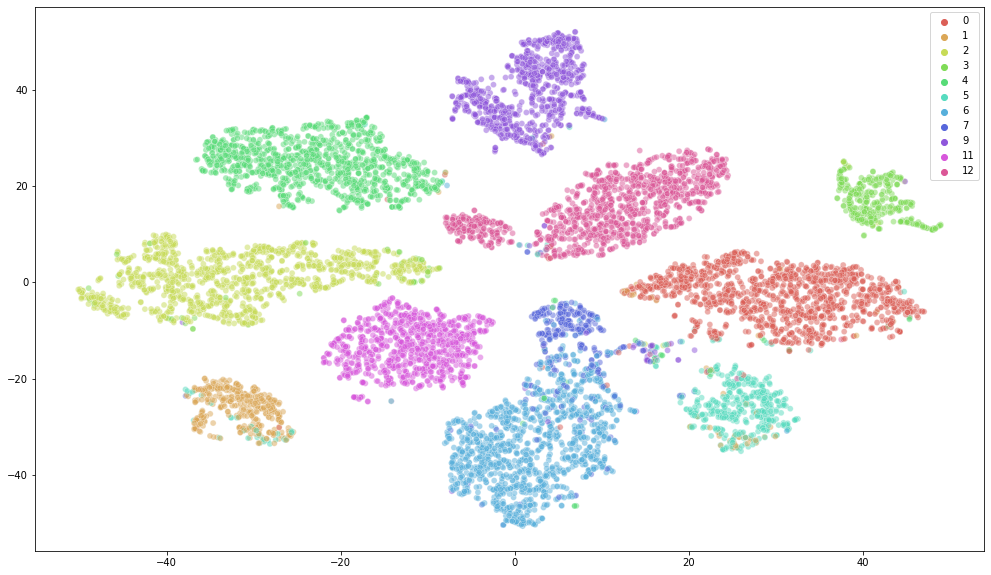

In [37]:
plot_embeddings(model, train_loader)

  0%|          | 0/42814 [00:47<?, ?it/s]

Counter({6: 5587, 0: 5506, 4: 5472, 2: 5251, 12: 5236, 9: 4403, 11: 3808, 5: 2052, 3: 1782, 7: 1679, 1: 1052})


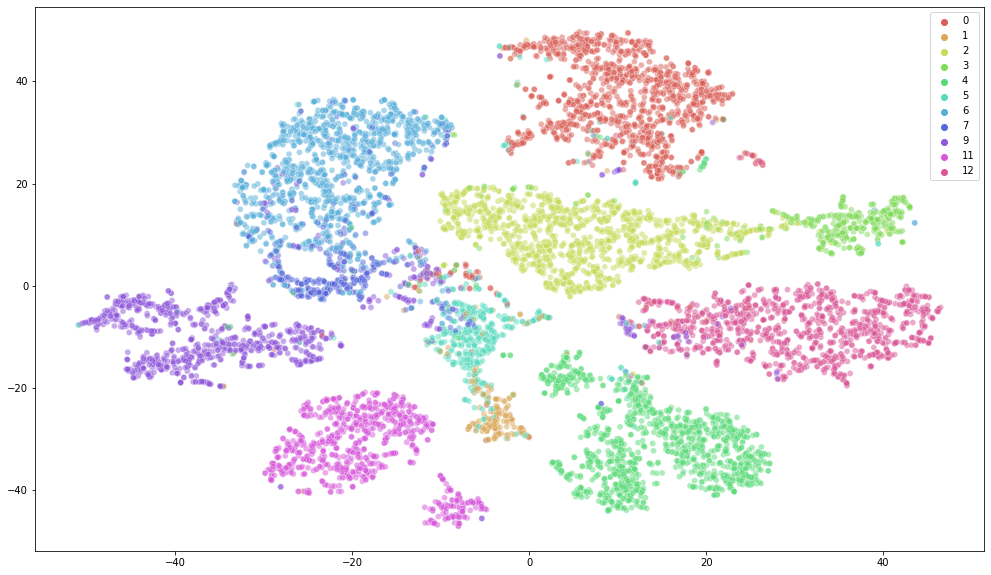

In [39]:
plot_embeddings(model, test_loader)

  0%|          | 0/42814 [00:46<?, ?it/s]

Counter({6: 5587, 0: 5506, 4: 5474, 2: 5265, 12: 5236, 9: 4403, 11: 3808, 5: 2036, 3: 1754, 7: 1707, 1: 1058})


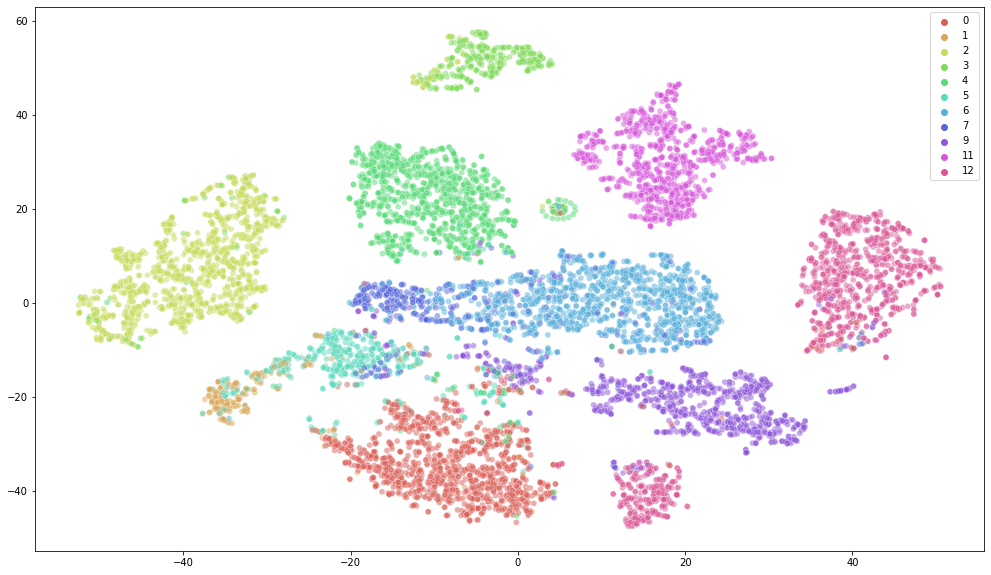

In [40]:
plot_embeddings(model, test_loader, share=0.1)

In [41]:
def plot_positives_vs_negatives(model, loader, share=1.0):
    positive_embeddings = defaultdict(list)
    negative_embeddings = defaultdict(list)
    for batch in tqdm(islice(loader, 0, 500)):
        img, labels, tasks = batch
        batch_size = img.size(0)
        img, labels = img.to(device), labels.to(device)
        features = model.get_embeddings(img)
        reprs, labels = ContrastiveLoss.prepare_reprs(features, labels, share)
        background_reprs, _ = ContrastiveLoss.prepare_reprs(features, 1 - labels, share / 10)
        
        label_mask = labels.sum(dim=(-1, -2)).view(batch_size * 2).type(torch.bool)
        good_idx = torch.arange(batch_size * 2)[label_mask]
        
        task_ids = torch.zeros((batch_size * 2), dtype=torch.long)
        task_ids[::2] = 2 * tasks  # organs
        task_ids[1::2] = 2 * tasks + 1  # tumors
        for i in good_idx:
            positive_embeddings[task_ids[i].item()].append(reprs[i].cpu().numpy())
            negative_embeddings[task_ids[i].item()].append(background_reprs[i].cpu().numpy())

    tasks = set(positive_embeddings.keys())
    n_plots = len(tasks)
    
    f, axs = plt.subplots(n_plots, 1, figsize=(10, 8 * n_plots))

    for i, task in enumerate(tasks):
        data_sample = np.concatenate([positive_embeddings[task], negative_embeddings[task]])
        labels_sample = np.concatenate([np.ones(len(positive_embeddings[task])), 
                                        np.zeros(len(negative_embeddings[task]))])
        proj = TSNE(n_components=2, n_jobs=16).fit_transform(data_sample.reshape(-1, 32))
        x, y = zip(*proj)
        style = labels_sample
        hue = labels_sample
        sns.scatterplot(
            x=x, y=y,
            hue=hue,
            style=style,
            palette=sns.color_palette("hls", 2),
            alpha=0.5,
            ax=axs[i]
        )
        axs[i].set_title(f'{task // 2} {"organ" if task % 2 == 0 else "tumor"}')

0it [00:00, ?it/s]

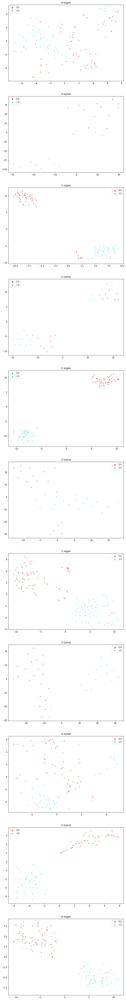

In [42]:
plot_positives_vs_negatives(model, test_loader, share=0.1)

0it [00:00, ?it/s]

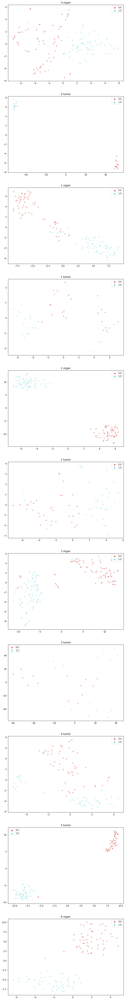

In [43]:
plot_positives_vs_negatives(model, test_loader, share=0.25)

0it [00:00, ?it/s]

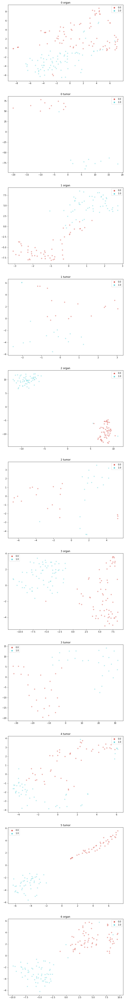

In [44]:
plot_positives_vs_negatives(model, test_loader, share=0.5)

0it [00:00, ?it/s]

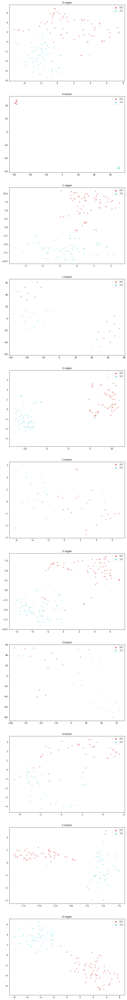

In [45]:
plot_positives_vs_negatives(model, test_loader, share=0.75)

0it [00:00, ?it/s]

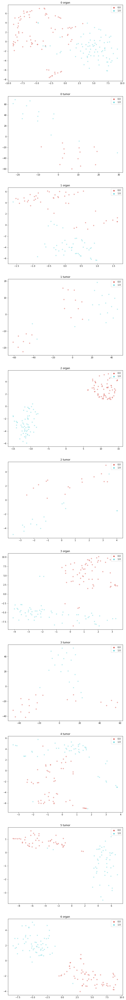

In [47]:
plot_positives_vs_negatives(model, test_loader)

0it [00:00, ?it/s]

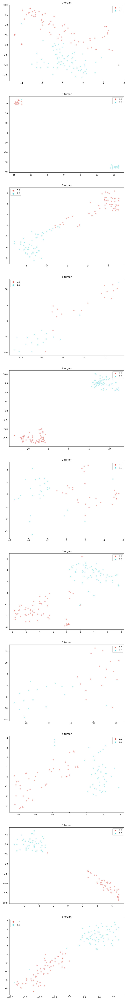

In [49]:
plot_positives_vs_negatives(model, train_loader)

In [8]:
def plot_samples(model, loader, n_sample=100):
    #loader with batch size 1 only for the probabilities
    model.eval()
    embeddings = defaultdict(list)
    lbls = defaultdict(list)

    for batch in tqdm(islice(loader, 0, 10000)):
        img, labels, tasks = batch
        img, labels = img.to(device), labels.to(device)
        features = model.get_embeddings(img)
        
        batch_size, d = features.size(0), features.size(1)

        features = features.view(batch_size, d, -1)
        labels = labels.view(batch_size, 2, -1)
        
        for i in range(2):
            lbl = labels[0, i, :].cpu().numpy()
            if lbl.sum() == 0:
                continue
                
            lbl /= lbl.sum() 
            pos_idx = np.random.choice(features.size(-1), n_sample // 2, p=lbl)
            neg_idx = np.random.choice(features.size(-1), n_sample // 2, p=(1-lbl) /sum(1 - lbl))
            idx = np.concatenate([pos_idx, neg_idx])
            features_sample = features.cpu().numpy()[0, :, idx]
            lbls_sample = labels.cpu().numpy()[0, i, idx]
            task_id = 2 * tasks.item() + i
            embeddings[task_id].append(features_sample)
            lbls[task_id].append(lbls_sample)

    tasks = set(embeddings.keys())
    n_plots = len(tasks)

    f, axs = plt.subplots(n_plots, 1, figsize=(10, 8 * n_plots))

    for i, task in enumerate(tasks):
        embedding = np.concatenate(embeddings[task])
        idx = torch.randperm(embedding.shape[0])[:10000].numpy()
        data_sample = np.concatenate(embeddings[task])[idx]
        labels_sample = np.concatenate(lbls[task])[idx]
        proj = TSNE(n_components=2, n_jobs=16).fit_transform(data_sample.reshape(-1, 32))
        x, y = zip(*proj)
        style = labels_sample
        hue = labels_sample
        sns.scatterplot(
            x=x, y=y,
            hue=hue,
            style=style,
            palette=sns.color_palette("hls", 2),
            alpha=0.5,
            ax=axs[i]
        )
        axs[i].set_title(f'{task // 2} {"organ" if task % 2 == 0 else "tumor"}')

0it [00:00, ?it/s]

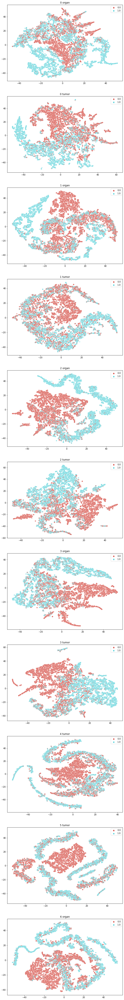

In [51]:
plot_samples(model, test_loader)

0it [00:00, ?it/s]

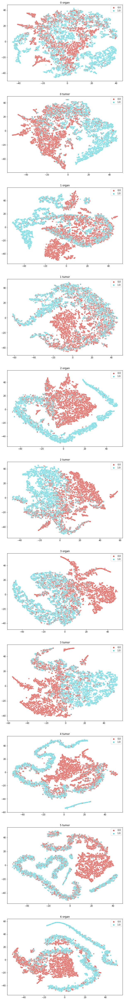

In [52]:
plot_samples(model, train_loader)

In [45]:
gathered_data = gather_paths(path='/home/ws/yy1833/training-repo/data_loading/DoDNet/dataset/list/MOTS/MOTS_train.txt')
train_data, test_data = sklearn_train_test_split(gathered_data, random_state=42)

train_set = get_TVSD_datasets(train_data, aug=strong_aug, n_procs=16, crop_size=[280, 149],
                              localised_crop=True, mode_3d=False)
test_set = get_TVSD_datasets(test_data, aug=strong_aug, n_procs=16, crop_size=[280, 149],
                              localised_crop=True, mode_3d=False)


train_set = TVSD_rebalance(train_set)
test_set = TVSD_rebalance(test_set)

checkpoint_path = '/home/ws/yy1833/training-repo/logs/logdir/disjoint_full_data/checkpoints/best_full.pth'
cp = torch.load(checkpoint_path, map_location={'cuda:0':'cuda:3'})
model = SegmentationModel(seg_model_name='deeplabv3_resnet50', 
                          in_channels=1, out_channels=32,
                          n_tasks=10, head_hidden=128)
partial_load(model, cp['model_state_dict'])
model.to(device)
model.eval()

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  41 tasks      | elapsed:  1.1min
[Parallel(n_jobs=16)]: Done 131 tasks      | elapsed:  1.8min
[Parallel(n_jobs=16)]: Done 257 tasks      | elapsed:  2.9min
[Parallel(n_jobs=16)]: Done 419 tasks      | elapsed:  4.3min
[Parallel(n_jobs=16)]: Done 617 tasks      | elapsed:  5.8min
[Parallel(n_jobs=16)]: Done 688 out of 688 | elapsed:  6.3min finished
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:   28.5s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:  1.1min
[Parallel(n_jobs=16)]: Done 230 out of 230 | elapsed:  2.0min finished


SegmentationModel(
  (in_conv): Conv2d(1, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (seg_model): DeepLabV3(
    (backbone): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): Bat

In [46]:
TASKS = {0: 'Liver', 1: 'Kidney', 2: 'HepaticVessel', 3: 'Pancreas', 4: 'Colon', 5: 'Lung', 6: 'Spleen'}
ROOT = '/mnt/data/machine-learning/arina/mots_embeddings/'

'''
for k, v in TASKS.items():
    for task in ['organ', 'tumor']:
        os.mkdir(ROOT + f'{k}{v}/{task}')
'''

"\nfor k, v in TASKS.items():\n    for task in ['organ', 'tumor']:\n        os.mkdir(ROOT + f'{k}{v}/{task}')\n"

In [47]:
def get_pixel_datasets(model, dataset, split, n_sample=100):
    model.eval()
    loader = DataLoader(dataset, batch_size=1, shuffle=False)
    filenames = defaultdict(int)
    task_type = ['organ', 'tumor']

    for batch in tqdm(loader):
        img, labels, tasks = batch
        batch_size = img.size(0)
        task = tasks.item()
        
        img, labels = img.to(device), labels
        features = model.get_embeddings(img)
        d = features.size(1)
        features = features.view(batch_size, d, -1)
        
        labels = labels.view(batch_size, 2, -1)
        
        for i in range(2):
            lbl = deepcopy(labels[0, i, :].cpu().numpy())
            if lbl.sum() == 0:
                continue
            
            task_id = 2 * task + i
            lbl /= lbl.sum() 
            pos_idx = np.random.choice(features.size(-1), n_sample // 2, p=lbl)
            neg_idx = np.random.choice(features.size(-1), n_sample // 2, p=(1-lbl) /sum(1 - lbl))
            idx = np.concatenate([pos_idx, neg_idx])
            features_sample = features.cpu()[0, :, torch.from_numpy(idx)].transpose(1, 0)
            lbls_sample = labels.cpu()[0, i, torch.from_numpy(idx)]
            
            torch.save((features_sample, lbls_sample), 
                     f'{ROOT}{task}{TASKS[task]}/{task_type[i]}/{split}_{filenames[task_id]}.pt')
            
            filenames[task_id] += 1
    
    for k, v in filenames.items():
        print(f'{k}: {v}')
    

In [48]:
get_pixel_datasets(model, train_set, split='train', n_sample=100)

  0%|          | 0/129956 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



11: 12023
0: 16894
1: 5694
9: 12240
4: 16431
12: 16274
2: 16077
6: 16790
5: 6538
3: 5177
7: 4309


In [49]:
get_pixel_datasets(model, test_set, split='val', n_sample=100)

  0%|          | 0/42814 [00:00<?, ?it/s]

2: 5245
3: 1780
4: 5481
12: 5360
0: 5721
9: 4349
1: 1155
6: 5531
11: 3592
7: 1656
5: 2134


In [52]:
ROOT = '/mnt/data/machine-learning/arina/mots_embeddings/'

for file in tqdm(os.listdir(ROOT)):
    if file.endswith(".txt"):
        name = ''.join(file.split('.')[:-1])
        with open(os.path.join(ROOT, file), 'r') as f:
            paths = list(map(str.strip, f.readlines()))
        
        train_paths, val_paths = [], []
        for path in paths:
            if path.split('/')[-1].startswith('train'):
                train_paths.append(os.path.join(ROOT, path))
            else:
                val_paths.append(os.path.join(ROOT, path))


        train_data, test_data = EmbeddingDataset(train_paths, int(file[0])), EmbeddingDataset(val_paths, int(file[0]))
        batch_size = 1
        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=False, drop_last=True)
        val_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=True)
        
        print(name, '\n')
        for i, batch in enumerate(tqdm(train_loader)):
            emb, labels, tasks = batch
            if emb.size(1) != 100:
                print(train_data.paths[i])
        

  0%|          | 0/19 [00:00<?, ?it/s]

1Kidney_tumor 



  0%|          | 0/5177 [00:00<?, ?it/s]

4Colon_tumor 



  0%|          | 0/12240 [00:00<?, ?it/s]

3Pancreas_organ 



  0%|          | 0/16790 [00:00<?, ?it/s]

0Liver_tumor 



  0%|          | 0/5694 [00:00<?, ?it/s]

5Lung_tumor 



  0%|          | 0/12023 [00:00<?, ?it/s]

3Pancreas_tumor 



  0%|          | 0/4309 [00:00<?, ?it/s]

1Kidney_organ 



  0%|          | 0/16077 [00:00<?, ?it/s]

2HepaticVessel_organ 



  0%|          | 0/16431 [00:00<?, ?it/s]

0Liver_organ 



  0%|          | 0/16894 [00:00<?, ?it/s]

2HepaticVessel_tumor 



  0%|          | 0/6538 [00:00<?, ?it/s]

6Spleen_organ 



  0%|          | 0/16274 [00:00<?, ?it/s]

## Testing the dataset

In [54]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
file = '0Liver_organ.txt'
with open(os.path.join(ROOT, file), 'r') as f:
    paths = list(map(str.strip, f.readlines()))

train_paths, val_paths = [], []
for path in paths:
    if path.split('/')[-1].startswith('train'):
        train_paths.append(os.path.join(ROOT, path))
    else:
        val_paths.append(os.path.join(ROOT, path))



train_data, test_data = EmbeddingDataset(train_paths, int(file[0])), EmbeddingDataset(val_paths, int(file[0]))

features, labels = [], []
for (ftrs, lbls, tasks) in islice(train_data, 0, 5):
    features.append(ftrs)
    labels.append(lbls)

X_train, y_train = np.concatenate(features), np.concatenate(labels).astype(int)

features, labels = [], []
for (ftrs, lbls, tasks) in test_data:
    features.append(ftrs)
    labels.append(lbls)
    
X_test, y_test = np.concatenate(features), np.concatenate(labels).astype(int)

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(500, 32) (500,) (572100, 32) (572100,)


In [55]:
from sklearn.preprocessing import StandardScaler
print(f'Positive class share: {y_train.sum() / len(y_train)}')
print(f'Positive class share: {y_test.sum() / len(y_test)}')
logreg = LogisticRegression(max_iter=1000)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
logreg.fit(X_train, y_train)
y_pred_test = logreg.predict_proba(X_test)[:, 1]
y_pred_train = logreg.predict_proba(X_train)[:, 1]
print('train roc auc:', roc_auc_score(y_train, y_pred_train), 'test roc auc:', roc_auc_score(y_test, y_pred_test))

Positive class share: 0.564
Positive class share: 0.6151354658276525
train roc auc: 0.9555273602706748 test roc auc: 0.8354690600427224


In [56]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=25, max_depth=16, n_jobs=16)
rf.fit(X_train, y_train)
y_pred_test = rf.predict_proba(X_test)[:, 1]
y_pred_train = rf.predict_proba(X_train)[:, 1]
print('train roc auc:', roc_auc_score(y_train, y_pred_train), 'test roc auc:', roc_auc_score(y_test, y_pred_test))

train roc auc: 0.9999918667447458 test roc auc: 0.8448114137703949


## Training the heads

In [57]:
from src.runners import EmbeddingRunner

In [ ]:
ROOT = '/mnt/data/machine-learning/arina/mots_embeddings/'
prev_name = 'disjoint_full_data'

for file in tqdm(os.listdir(ROOT)):
    if file.endswith(".txt"):
        name = ''.join(file.split('.')[:-1])
        checkpoint_path = f'/home/ws/yy1833/training-repo/logs/logdir/{prev_name}/checkpoints/best.pth'
        cp = torch.load(checkpoint_path)
        model = SegmentationModel(seg_model_name='deeplabv3_resnet50', 
                                  in_channels=1, out_channels=32,
                                  n_tasks=7, head_hidden=512)
        w = cp['model_state_dict']
        if prev_name == 'disjoint_full_data':
            w = {k: v for k, v in cp['model_state_dict'].items() if 'heads' not in k}
        partial_load(model, w)
        

        with open(os.path.join(ROOT, file), 'r') as f:
            paths = list(map(str.strip, f.readlines()))
        
        train_paths, val_paths = [], []
        for path in paths:
            if path.split('/')[-1].startswith('train'):
                train_paths.append(os.path.join(ROOT, path))
            else:
                val_paths.append(os.path.join(ROOT, path))


        train_data, test_data = EmbeddingDataset(train_paths, int(file[0])), EmbeddingDataset(val_paths, int(file[0]))
        batch_size = 256
        loaders = {
                "train": DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True),
                "valid": DataLoader(test_data, batch_size=batch_size, shuffle=True, drop_last=True),
        }

        emb_runner = EmbeddingRunner()
        criterion = BCEWithLogitsLoss()
        optimizer = torch.optim.Adam(model.heads[train_data.task_id].parameters(), lr=3e-4, weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)
        
        n_epochs = 250
        # model training
        emb_runner.train(
            model=model,
            optimizer=optimizer,
            criterion=criterion,
            scheduler = scheduler,
            loaders=loaders,
            logdir=f"/home/ws/yy1833/training-repo/logs/logdir/{name}",
            num_epochs=n_epochs,
            verbose=False,
            timeit=True,
            callbacks=[
                WandbLogger(project="unsupervised-segmentation", name=f'classification head {train_data.task_id}'),
                dl.CheckpointCallback(1),
                EarlyStoppingCallback(10),
                dl.OptimizerCallback(), 
                dl.SchedulerCallback(),
                dl.AUCCallback(output_key='probs'),
                dl.AccuracyCallback(output_key='preds')
            ]
        )
        
        prev_name=name


  0%|          | 0/19 [00:00<?, ?it/s]

/home/ws/yy1833/anaconda3/envs/seg/lib/python3.8/site-packages/torch/nn/functional.py:1639: UserWarning:

nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.



[2021-06-29 17:28:18,083] 
1/250 * Epoch 1 (_base): lr=0.0003 | momentum=0.9000
1/250 * Epoch 1 (train): _timer/_fps=66.3582 | _timer/batch_time=4.4245 | _timer/data_time=4.4203 | _timer/model_time=0.0042 | accuracy01=0.5840 | auc/class_00=0.7449 | auc/mean=0.7449 | loss=0.6496
1/250 * Epoch 1 (valid): _timer/_fps=234.2082 | _timer/batch_time=1.3256 | _timer/data_time=1.3238 | _timer/model_time=0.0018 | accuracy01=0.6422 | auc/class_00=0.7572 | auc/mean=0.7572 | loss=0.6337


/home/ws/yy1833/anaconda3/envs/seg/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:508: UserWarning:

To get the last learning rate computed by the scheduler, please use `get_last_lr()`.



[2021-06-29 17:28:30,598] 
2/250 * Epoch 2 (_base): lr=0.0003 | momentum=0.9000
2/250 * Epoch 2 (train): _timer/_fps=3205.4904 | _timer/batch_time=0.0846 | _timer/data_time=0.0830 | _timer/model_time=0.0016 | accuracy01=0.6642 | auc/class_00=0.7958 | auc/mean=0.7958 | loss=0.6033
2/250 * Epoch 2 (valid): _timer/_fps=253.0505 | _timer/batch_time=1.0418 | _timer/data_time=1.0401 | _timer/model_time=0.0017 | accuracy01=0.6936 | auc/class_00=0.7715 | auc/mean=0.7715 | loss=0.6011
[2021-06-29 17:28:37,228] 
3/250 * Epoch 3 (_base): lr=0.0003 | momentum=0.9000
3/250 * Epoch 3 (train): _timer/_fps=4122.2663 | _timer/batch_time=0.0770 | _timer/data_time=0.0752 | _timer/model_time=0.0018 | accuracy01=0.7144 | auc/class_00=0.8066 | auc/mean=0.8066 | loss=0.5730
3/250 * Epoch 3 (valid): _timer/_fps=3467.1689 | _timer/batch_time=0.0753 | _timer/data_time=0.0735 | _timer/model_time=0.0019 | accuracy01=0.7038 | auc/class_00=0.7800 | auc/mean=0.7800 | loss=0.5790
[2021-06-29 17:28:43,112] 
4/250 * Ep

[2021-06-29 17:32:34,093] 
19/250 * Epoch 19 (_base): lr=0.0003 | momentum=0.9000
19/250 * Epoch 19 (train): _timer/_fps=4898.4862 | _timer/batch_time=0.0544 | _timer/data_time=0.0523 | _timer/model_time=0.0022 | accuracy01=0.7666 | auc/class_00=0.8484 | auc/mean=0.8484 | loss=0.4750
19/250 * Epoch 19 (valid): _timer/_fps=5856.9372 | _timer/batch_time=0.0438 | _timer/data_time=0.0424 | _timer/model_time=0.0015 | accuracy01=0.7416 | auc/class_00=0.8222 | auc/mean=0.8222 | loss=0.5115
[2021-06-29 17:32:38,207] 
20/250 * Epoch 20 (_base): lr=0.0003 | momentum=0.9000
20/250 * Epoch 20 (train): _timer/_fps=4991.4062 | _timer/batch_time=0.0534 | _timer/data_time=0.0514 | _timer/model_time=0.0020 | accuracy01=0.7678 | auc/class_00=0.8498 | auc/mean=0.8498 | loss=0.4726
20/250 * Epoch 20 (valid): _timer/_fps=7348.7504 | _timer/batch_time=0.0350 | _timer/data_time=0.0336 | _timer/model_time=0.0013 | accuracy01=0.7380 | auc/class_00=0.8184 | auc/mean=0.8184 | loss=0.5145
[2021-06-29 17:32:42,068

[2021-06-29 17:33:46,469] 
36/250 * Epoch 36 (_base): lr=0.0003 | momentum=0.9000
36/250 * Epoch 36 (train): _timer/_fps=5033.8813 | _timer/batch_time=0.0527 | _timer/data_time=0.0508 | _timer/model_time=0.0020 | accuracy01=0.7876 | auc/class_00=0.8665 | auc/mean=0.8665 | loss=0.4438
36/250 * Epoch 36 (valid): _timer/_fps=6461.0695 | _timer/batch_time=0.0401 | _timer/data_time=0.0358 | _timer/model_time=0.0043 | accuracy01=0.7696 | auc/class_00=0.8421 | auc/mean=0.8421 | loss=0.4846
[2021-06-29 17:33:51,110] 
37/250 * Epoch 37 (_base): lr=0.0003 | momentum=0.9000
37/250 * Epoch 37 (train): _timer/_fps=4528.9993 | _timer/batch_time=0.0586 | _timer/data_time=0.0557 | _timer/model_time=0.0029 | accuracy01=0.7889 | auc/class_00=0.8671 | auc/mean=0.8671 | loss=0.4429
37/250 * Epoch 37 (valid): _timer/_fps=6577.0887 | _timer/batch_time=0.0414 | _timer/data_time=0.0401 | _timer/model_time=0.0013 | accuracy01=0.7700 | auc/class_00=0.8405 | auc/mean=0.8405 | loss=0.4863
[2021-06-29 17:33:55,079

[2021-06-29 17:34:55,164] 
53/250 * Epoch 53 (_base): lr=0.0002 | momentum=0.9000
53/250 * Epoch 53 (train): _timer/_fps=5001.7593 | _timer/batch_time=0.0519 | _timer/data_time=0.0503 | _timer/model_time=0.0016 | accuracy01=0.7985 | auc/class_00=0.8749 | auc/mean=0.8749 | loss=0.4289
53/250 * Epoch 53 (valid): _timer/_fps=7178.8086 | _timer/batch_time=0.0357 | _timer/data_time=0.0340 | _timer/model_time=0.0017 | accuracy01=0.7832 | auc/class_00=0.8512 | auc/mean=0.8512 | loss=0.4712
[2021-06-29 17:34:59,054] 
54/250 * Epoch 54 (_base): lr=0.0002 | momentum=0.9000
54/250 * Epoch 54 (train): _timer/_fps=4738.5137 | _timer/batch_time=0.0552 | _timer/data_time=0.0535 | _timer/model_time=0.0017 | accuracy01=0.7992 | auc/class_00=0.8756 | auc/mean=0.8756 | loss=0.4278
54/250 * Epoch 54 (valid): _timer/_fps=6941.6001 | _timer/batch_time=0.0369 | _timer/data_time=0.0353 | _timer/model_time=0.0016 | accuracy01=0.7837 | auc/class_00=0.8528 | auc/mean=0.8528 | loss=0.4712
[2021-06-29 17:35:03,030

[2021-06-29 17:36:03,303] 
70/250 * Epoch 70 (_base): lr=0.0002 | momentum=0.9000
70/250 * Epoch 70 (train): _timer/_fps=4791.9385 | _timer/batch_time=0.0544 | _timer/data_time=0.0527 | _timer/model_time=0.0017 | accuracy01=0.8041 | auc/class_00=0.8796 | auc/mean=0.8796 | loss=0.4210
70/250 * Epoch 70 (valid): _timer/_fps=7238.9125 | _timer/batch_time=0.0355 | _timer/data_time=0.0338 | _timer/model_time=0.0017 | accuracy01=0.7876 | auc/class_00=0.8572 | auc/mean=0.8572 | loss=0.4665
[2021-06-29 17:36:07,497] 
71/250 * Epoch 71 (_base): lr=0.0002 | momentum=0.9000
71/250 * Epoch 71 (train): _timer/_fps=4540.2689 | _timer/batch_time=0.0577 | _timer/data_time=0.0560 | _timer/model_time=0.0017 | accuracy01=0.8051 | auc/class_00=0.8804 | auc/mean=0.8804 | loss=0.4195
71/250 * Epoch 71 (valid): _timer/_fps=7355.7783 | _timer/batch_time=0.0348 | _timer/data_time=0.0331 | _timer/model_time=0.0017 | accuracy01=0.7897 | auc/class_00=0.8583 | auc/mean=0.8583 | loss=0.4620
[2021-06-29 17:36:12,671

[2021-06-29 17:37:12,731] 
87/250 * Epoch 87 (_base): lr=0.0002 | momentum=0.9000
87/250 * Epoch 87 (train): _timer/_fps=4369.0381 | _timer/batch_time=0.0597 | _timer/data_time=0.0581 | _timer/model_time=0.0017 | accuracy01=0.8078 | auc/class_00=0.8830 | auc/mean=0.8830 | loss=0.4151
87/250 * Epoch 87 (valid): _timer/_fps=6314.2755 | _timer/batch_time=0.0406 | _timer/data_time=0.0389 | _timer/model_time=0.0016 | accuracy01=0.7910 | auc/class_00=0.8603 | auc/mean=0.8603 | loss=0.4605
[2021-06-29 17:37:16,696] 
88/250 * Epoch 88 (_base): lr=0.0002 | momentum=0.9000
88/250 * Epoch 88 (train): _timer/_fps=4888.3773 | _timer/batch_time=0.0534 | _timer/data_time=0.0519 | _timer/model_time=0.0015 | accuracy01=0.8087 | auc/class_00=0.8833 | auc/mean=0.8833 | loss=0.4153
88/250 * Epoch 88 (valid): _timer/_fps=5522.3315 | _timer/batch_time=0.0482 | _timer/data_time=0.0465 | _timer/model_time=0.0017 | accuracy01=0.7927 | auc/class_00=0.8607 | auc/mean=0.8607 | loss=0.4626
[2021-06-29 17:37:20,696

[2021-06-29 17:39:07,479] 
104/250 * Epoch 104 (_base): lr=0.0001 | momentum=0.9000
104/250 * Epoch 104 (train): _timer/_fps=4722.7581 | _timer/batch_time=0.0553 | _timer/data_time=0.0537 | _timer/model_time=0.0016 | accuracy01=0.8112 | auc/class_00=0.8859 | auc/mean=0.8859 | loss=0.4104
104/250 * Epoch 104 (valid): _timer/_fps=5755.2817 | _timer/batch_time=0.0445 | _timer/data_time=0.0428 | _timer/model_time=0.0017 | accuracy01=0.7941 | auc/class_00=0.8636 | auc/mean=0.8636 | loss=0.4539
[2021-06-29 17:39:12,734] 
105/250 * Epoch 105 (_base): lr=0.0001 | momentum=0.9000
105/250 * Epoch 105 (train): _timer/_fps=4380.0184 | _timer/batch_time=0.0591 | _timer/data_time=0.0575 | _timer/model_time=0.0016 | accuracy01=0.8108 | auc/class_00=0.8859 | auc/mean=0.8859 | loss=0.4107
105/250 * Epoch 105 (valid): _timer/_fps=8164.5031 | _timer/batch_time=0.0314 | _timer/data_time=0.0299 | _timer/model_time=0.0015 | accuracy01=0.7937 | auc/class_00=0.8617 | auc/mean=0.8617 | loss=0.4591
[2021-06-29 

[2021-06-29 17:40:15,878] 
121/250 * Epoch 121 (_base): lr=9.923e-05 | momentum=0.9000
121/250 * Epoch 121 (train): _timer/_fps=4688.3604 | _timer/batch_time=0.0562 | _timer/data_time=0.0542 | _timer/model_time=0.0020 | accuracy01=0.8124 | auc/class_00=0.8873 | auc/mean=0.8873 | loss=0.4083
121/250 * Epoch 121 (valid): _timer/_fps=6728.2685 | _timer/batch_time=0.0387 | _timer/data_time=0.0363 | _timer/model_time=0.0023 | accuracy01=0.7931 | auc/class_00=0.8647 | auc/mean=0.8647 | loss=0.4558
[2021-06-29 17:40:19,746] 
122/250 * Epoch 122 (_base): lr=9.701e-05 | momentum=0.9000
122/250 * Epoch 122 (train): _timer/_fps=4424.1995 | _timer/batch_time=0.0592 | _timer/data_time=0.0570 | _timer/model_time=0.0022 | accuracy01=0.8121 | auc/class_00=0.8873 | auc/mean=0.8873 | loss=0.4085
122/250 * Epoch 122 (valid): _timer/_fps=7049.9655 | _timer/batch_time=0.0371 | _timer/data_time=0.0358 | _timer/model_time=0.0013 | accuracy01=0.7969 | auc/class_00=0.8660 | auc/mean=0.8660 | loss=0.4556
[2021-

auc/class_00/train,0.88837
auc/mean/train,0.88837
loss/train,0.40649
accuracy01/train,0.81323
timer/data_time/train,0.05508
timer/model_time/train,0.00209
timer/batch_time/train,0.05717
timer/_fps/train,4630.17317
auc/class_00/valid,0.86599
auc/mean/valid,0.86599
loss/valid,0.4559


auc/class_00/train,▁▂▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████████████
auc/mean/train,▁▂▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████████████
loss/train,█▆▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
accuracy01/train,▁▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████████████████
timer/data_time/train,▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁
timer/model_time/train,▂▃▆▃▃▆▃▃▃▃▄▃▃▃▁▃▂▆▂▁▂▂▂▆▃▂▁▁▃▃▂▁▂▁▁▃▅█▂▄
timer/batch_time/train,▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁
timer/_fps/train,▅▇▁▇█▇█▇██▇██▇▇▇▇▇▇▇█▇▇▇▇▇▇█▆▄▇█▇▇█▇▇▇▇▇
auc/class_00/valid,▁▂▃▃▄▅▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇██████████████
auc/mean/valid,▁▂▃▃▄▅▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇██████████████
loss/valid,█▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Top best models:
/home/ws/yy1833/training-repo/logs/logdir/1Kidney_tumor/checkpoints/train.118.pth	0.4529


wandb: wandb version 0.10.32 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[2021-06-29 17:42:45,370] 
1/250 * Epoch 1 (_base): lr=0.0003 | momentum=0.9000
1/250 * Epoch 1 (train): _timer/_fps=165.9442 | _timer/batch_time=1.5441 | _timer/data_time=1.5417 | _timer/model_time=0.0024 | accuracy01=0.7374 | auc/class_00=0.8489 | auc/mean=0.8489 | loss=0.5556
1/250 * Epoch 1 (valid): _timer/_fps=178.9299 | _timer/batch_time=1.4808 | _timer/data_time=1.4784 | _timer/model_time=0.0024 | accuracy01=0.6810 | auc/class_00=0.7838 | auc/mean=0.7838 | loss=0.5736
[2021-06-29 17:43:53,774] 
2/250 * Epoch 2 (_base): lr=0.0003 | momentum=0.9000
2/250 * Epoch 2 (train): _timer/_fps=200.8681 | _timer/batch_time=1.3018 | _timer/data_time=1.2993 | _timer/model_time=0.0025 | accuracy01=0.8052 | auc/class_00=0.8868 | auc/mean=0.8868 | loss=0.4637
2/250 * Epoch 2 (valid): _timer/_fps=2132.3822 | _timer/batch_time=0.1240 | _timer/data_time=0.1224 | _timer/model_time=0.0016 | accuracy01=0.6858 | auc/class_00=0.8064 | auc/mean=0.8064 | loss=0.5510
[2021-06-29 17:44:05,007] 
3/250 * Epoc

[2021-06-29 17:49:44,411] 
18/250 * Epoch 18 (_base): lr=0.0003 | momentum=0.9000
18/250 * Epoch 18 (train): _timer/_fps=120.1398 | _timer/batch_time=3.6482 | _timer/data_time=3.6461 | _timer/model_time=0.0021 | accuracy01=0.8731 | auc/class_00=0.9358 | auc/mean=0.9358 | loss=0.3088
18/250 * Epoch 18 (valid): _timer/_fps=172.1791 | _timer/batch_time=1.7228 | _timer/data_time=1.7201 | _timer/model_time=0.0027 | accuracy01=0.7664 | auc/class_00=0.8720 | auc/mean=0.8720 | loss=0.5220
[2021-06-29 17:50:47,541] 
19/250 * Epoch 19 (_base): lr=0.0003 | momentum=0.9000
19/250 * Epoch 19 (train): _timer/_fps=216.0445 | _timer/batch_time=1.1946 | _timer/data_time=1.1919 | _timer/model_time=0.0027 | accuracy01=0.8737 | auc/class_00=0.9363 | auc/mean=0.9363 | loss=0.3080
19/250 * Epoch 19 (valid): _timer/_fps=2189.4795 | _timer/batch_time=0.1242 | _timer/data_time=0.1219 | _timer/model_time=0.0023 | accuracy01=0.7690 | auc/class_00=0.8737 | auc/mean=0.8737 | loss=0.5181
[2021-06-29 17:50:57,073] 


auc/class_00/train,0.93851
auc/mean/train,0.93851
loss/train,0.3025
accuracy01/train,0.87646
timer/data_time/train,0.06083
timer/model_time/train,0.00397
timer/batch_time/train,0.0648
timer/_fps/train,4019.87841
auc/class_00/valid,0.87679
auc/mean/valid,0.87679
loss/valid,0.52007


auc/class_00/train,▁▄▅▅▆▆▆▇▇▇▇▇▇█████████████
auc/mean/train,▁▄▅▅▆▆▆▇▇▇▇▇▇█████████████
loss/train,█▅▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
accuracy01/train,▁▄▅▅▆▆▆▇▇▇▇▇██████████████
timer/data_time/train,▄▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▃▁▁▁▁▁▁▁
timer/model_time/train,▃▃▂▂▄▅▂▂▅▆▁▁▅▃▁▁▂▂▄▂▂▂▃▃▂█
timer/batch_time/train,▄▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▃▁▁▁▁▁▁▁
timer/_fps/train,▁▁▅█▇▇▇█▇▇██▇█▇▇▇▁▁▆█▇▇██▇
auc/class_00/valid,▁▃▄▄▅▅▆▆▆▇▇▇▇▇▇███████████
auc/mean/valid,▁▃▄▄▅▅▆▆▆▇▇▇▇▇▇███████████
loss/valid,█▅▅▅▅▃▃▂▂▁▁▁▁▁▁▁▂▂▁▁▂▂▂▂▂▂


Top best models:
/home/ws/yy1833/training-repo/logs/logdir/4Colon_tumor/checkpoints/train.16.pth	0.5158


[2021-06-29 17:59:31,632] 
1/250 * Epoch 1 (_base): lr=0.0003 | momentum=0.9000
1/250 * Epoch 1 (train): _timer/_fps=60.3583 | _timer/batch_time=6.2435 | _timer/data_time=6.2412 | _timer/model_time=0.0023 | accuracy01=0.7687 | auc/class_00=0.8475 | auc/mean=0.8475 | loss=0.5442
1/250 * Epoch 1 (valid): _timer/_fps=177.4944 | _timer/batch_time=1.4765 | _timer/data_time=1.4743 | _timer/model_time=0.0022 | accuracy01=0.8079 | auc/class_00=0.8802 | auc/mean=0.8802 | loss=0.4771
[2021-06-29 18:00:36,003] 
2/250 * Epoch 2 (_base): lr=0.0003 | momentum=0.9000
2/250 * Epoch 2 (train): _timer/_fps=300.2142 | _timer/batch_time=0.8589 | _timer/data_time=0.8566 | _timer/model_time=0.0023 | accuracy01=0.8312 | auc/class_00=0.8985 | auc/mean=0.8985 | loss=0.4339
2/250 * Epoch 2 (valid): _timer/_fps=3460.0976 | _timer/batch_time=0.0784 | _timer/data_time=0.0762 | _timer/model_time=0.0023 | accuracy01=0.8296 | auc/class_00=0.8970 | auc/mean=0.8970 | loss=0.4150
[2021-06-29 18:00:48,541] 
3/250 * Epoch

In [61]:
last_name = '6Spleen_organ'
checkpoint_path = f'/home/ws/yy1833/training-repo/logs/logdir/{last_name}/checkpoints/best.pth'
cp = torch.load(checkpoint_path)
model = SegmentationModel(seg_model_name='deeplabv3_resnet50', 
                          in_channels=1, out_channels=32,
                          n_tasks=7, head_hidden=128)
partial_load(model, cp['model_state_dict'])
model.eval()

        
for file in tqdm(os.listdir(ROOT)):
    if file.endswith(".txt"):
        name = ''.join(file.split('.')[:-1])

        with open(os.path.join(ROOT, file), 'r') as f:
            paths = list(map(str.strip, f.readlines()))
        
        train_paths, val_paths = [], []
        for path in paths:
            if path.split('/')[-1].startswith('train'):
                train_paths.append(os.path.join(ROOT, path))
            else:
                val_paths.append(os.path.join(ROOT, path))


        train_data, test_data = EmbeddingDataset(train_paths, int(file[0])), EmbeddingDataset(val_paths, int(file[0]))
        batch_size = 256
        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True)
        val_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True, drop_last=True)

        all_probs, all_labels = [], []
        for batch in tqdm(train_loader):
            emb, labels, tasks = batch
            d = emb.size(-1)
            emb = emb.view(-1, d, 1, 1)
            with torch.no_grad():
                features = model.train_head(emb, tasks[0]).view(-1, 1)
            probs = torch.sigmoid(features)
            labels = labels.view(-1, 1)
            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
        y_scores = np.concatenate(all_probs)
        y_true = np.concatenate(all_labels)
        precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
        f1 = 2 * (precision * recall) / (precision + recall)
        i = np.nanargmax(f1)
        print(f'For the task: {name}, the best F1-score is: {f1[i]}, with a threshold: {thresholds[i]}', flush=True)

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

For the task: 1Kidney_tumor, the best F1-score is: 0.8272438248960626, with a threshold: 0.4322945773601532


  0%|          | 0/45 [00:00<?, ?it/s]

For the task: 4Colon_tumor, the best F1-score is: 0.8769261892977, with a threshold: 0.4501655399799347


<ipython-input-61-a207b26fbff6>:45: RuntimeWarning:

invalid value encountered in true_divide



  0%|          | 0/66 [00:00<?, ?it/s]

For the task: 3Pancreas_organ, the best F1-score is: 0.8845446038845028, with a threshold: 0.46087348461151123


  0%|          | 0/21 [00:00<?, ?it/s]

For the task: 0Liver_tumor, the best F1-score is: 0.8564236486911103, with a threshold: 0.42613303661346436


  0%|          | 0/48 [00:00<?, ?it/s]

For the task: 5Lung_tumor, the best F1-score is: 0.8492215124287121, with a threshold: 0.4324692487716675


  0%|          | 0/17 [00:00<?, ?it/s]

For the task: 3Pancreas_tumor, the best F1-score is: 0.8730747191303895, with a threshold: 0.43716344237327576


  0%|          | 0/62 [00:00<?, ?it/s]

For the task: 1Kidney_organ, the best F1-score is: 0.8937584940679904, with a threshold: 0.5299727320671082


  0%|          | 0/64 [00:00<?, ?it/s]

For the task: 2HepaticVessel_organ, the best F1-score is: 0.9119137938022903, with a threshold: 0.4169667065143585


  0%|          | 0/65 [00:00<?, ?it/s]

For the task: 0Liver_organ, the best F1-score is: 0.9093822872972657, with a threshold: 0.49119463562965393


  0%|          | 0/26 [00:00<?, ?it/s]

For the task: 2HepaticVessel_tumor, the best F1-score is: 0.8559165344263726, with a threshold: 0.44491904973983765


  0%|          | 0/64 [00:00<?, ?it/s]

For the task: 6Spleen_organ, the best F1-score is: 0.9167831900668576, with a threshold: 0.4789682626724243
